# Intro

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [ ]:
#expt_path = 'C:\\_Data\\Lairon\\2025_06_02\\'
cfg_file='lairon3.yml'
expt_path = 'C:\\_Data\\Lairon\\2025_06_16\\'
# cfg_file='lairon3.yml'

ip = '192.168.137.1'
max_t1 = 150

## Imports

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from qick import QickConfig
import sys 
sys.path.append('../')
from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, tuneup
from slab_qick_calib import handy
from tqdm.notebook import tqdm
from slab_qick_calib.calib.time_tracking import time_tracking

%load_ext autoreload
%autoreload 2

# Set color palette and font size
handy.config_figs()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Set up new config 
Set to variables to True when setting up a new experiment. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_init_config_manual.md

In [ ]:
# Set to false if you aren't creating a new one
new_config = False
new_folder = False

nqubits = 3
rfsoc_alias = 'Qick105'
t1_guess = 50 

import os
import slab_qick_calib.config as config

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:


    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess)

    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\Lairon\2025_06_16\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

In [24]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=ip)
print(im)
soc = QickConfig(im[auto_cfg['aliases']['soc']].get_cfg())
print(soc)

cfg_dict = {'soc': soc, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

{'Pyro.NameServer': <Pyro4.core.Proxy at 0x133f0e663b0; not connected; for PYRO:Pyro.NameServer@192.168.137.1:9090>, 'chatot': <Pyro4.core.Proxy at 0x133f0e668f0; not connected; for PYRO:obj_3ba60199343a44dbaff3c740348d0ef3@192.168.137.104:36851>, 'Qick105': <Pyro4.core.Proxy at 0x133f0e66620; not connected; for PYRO:obj_40b77eb412b6406ea3320e466232f9de@192.168.137.105:38657>, 'Qick233': <Pyro4.core.Proxy at 0x133f0e66380; not connected; for PYRO:obj_a27edc631cdb489a979eb5bac3d75853@192.168.137.233:33953>}
QICK running on RFSoC4x2, software version 0.2.340

Firmware configuration (built Sun Sep 29 15:34:24 2024):

	Global clocks (MHz): tProc dispatcher timing 614.400, RF reference 491.520
	Groups of related clocks: [tProc timing clock, DAC tile 0, DAC tile 2], [ADC tile 0]

	2 signal generator channels:
	0:	axis_signal_gen_v6 - envelope memory 65536 samples (6.667 us)
		fs=9830.400 Msps, fabric=614.400 MHz, 32-bit DDS, range=9830.400 MHz
		DAC tile 0, blk 0 is DAC_B
	1:	axis_signal_gen

## How to update config (you can also just edit yml directly)

In [ ]:
# #                                          param   value qubit #
# auto_cfg = config.update_readout(cfg_path, 'lamb', 5, qi)
# auto_cfg = config.update_qubit(cfg_path, 'f_ge', 5700, qi)

# # For multiple levels of nesting: 
# auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), 0.2, qi)

## Print scan params

In [ ]:
t1 = meas.T1Experiment(cfg_dict, qi=0, print=True)

reps: 200
soft_avgs: 1
expts: 60
start: 0
span: 277.90700000000004
acStark: False
active_reset: False
qubit: [0]
qubit_chan: 1


In general, all scans will be interacted with either by running default, or giving arguments from params dict. 
You can run scans on list of different qubits or just one by adding first couple lines of each cell. 
Flag of update is used to decide if to set new config vals based on output of scan (if the fit looks good)

## Check QICK issues

### Check mirror frequencies on qubit

In [ ]:
import qick_check
qick_check.check_freqs(0, cfg_dict)

Nyquist frequency: 4915.2 MHz
Possible g-e frequencies: 3390.2158 MHz and 6440.1842 MHz
Possible e-f frequencies: 3247.7156 MHz and 6582.6844 MHz
Anharmonicity: 142.50019999999995 MHz. With aliased e-f: -3192.4686 MHz
Aliased e-f frequency is greater than both g-e frequencies.
Recommendation: Current e-f frequency is the correct choice.


### Check mirror frequencies from resonators

In [ ]:
import qick_check
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4915.2 MHz
Configured resonator frequencies (MHz):
[5375.8194 5915.3729 6623.1401]
Aliased resonator frequencies (MHz):
[4454.5806 3915.0271 3207.2599]


### Check sampling rates and minimum point spacing

In [ ]:
cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
cfg_dict['soc'].cycles2us(1)

0.0016276041666666667

### Make sure you're not near the nyquist frequency of the ADC

In [ ]:
import qick_check
qick_check.check_adc(cfg_dict)

ADC sampling frequency: 4423.68


# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

  0%|          | 0/1000 [00:00<?, ?it/s]

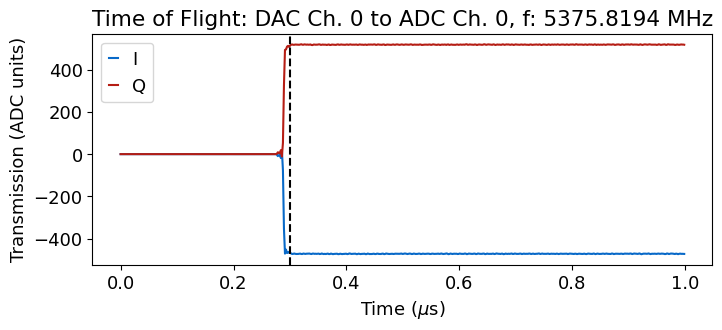

In [15]:
qubit_list = np.arange(3)
qubit_list = [0]
for qi in qubit_list:  
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length up to 13 us
        #tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi,params={'readout_length':13})#,params={'frequency':fi})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [ ]:
qubit_list=np.arange(3)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.65, qi)

## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [ ]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

  0%|          | 0/800000 [00:00<?, ?it/s]

Number of peaks: 0


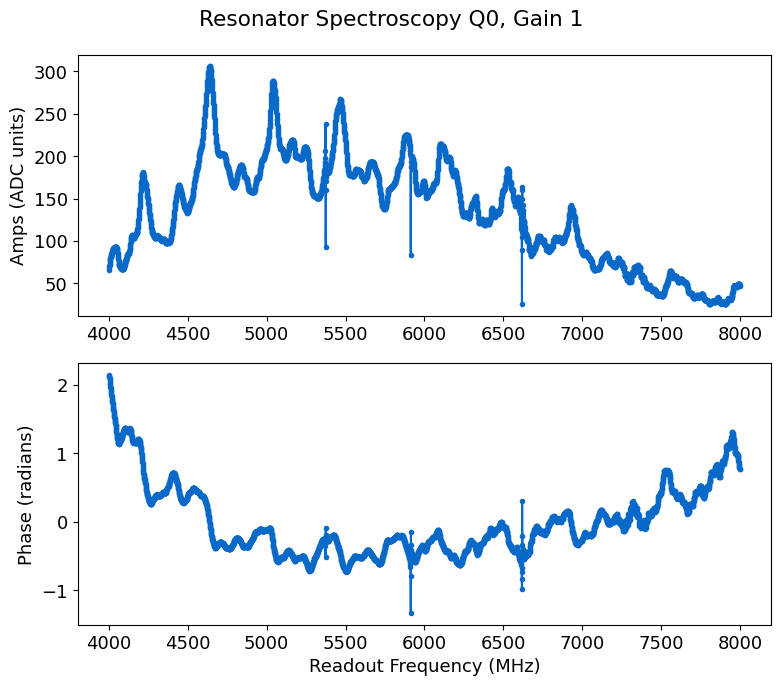

In [ ]:
qi=0 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
 
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', params={'start':4000, 'span':4000, 'reps':200, 'gain':1, 'expts':4000})
res_values = rspecc.data['coarse_peaks']

Change prom (prominence value) to adjust how many peaks you find

Number of peaks: 1


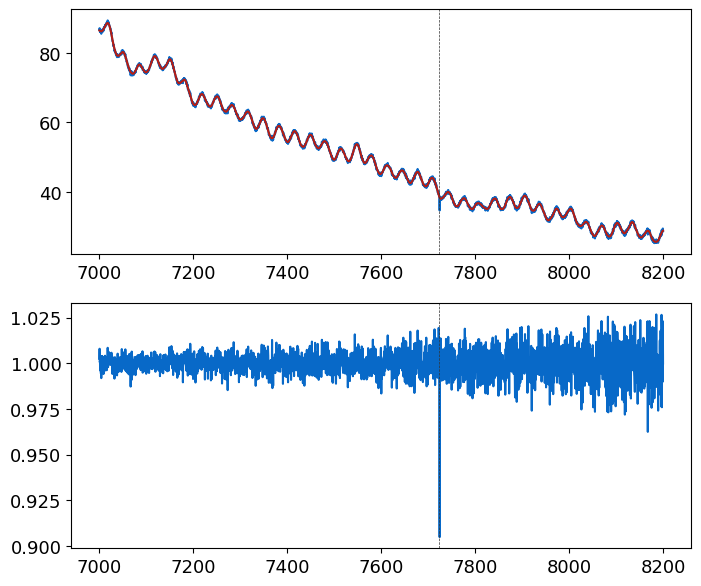

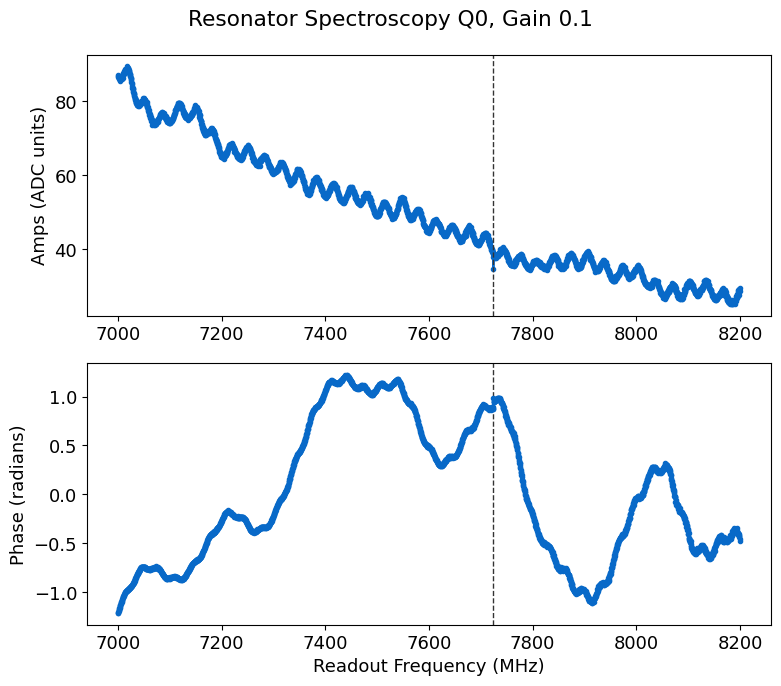

In [121]:
rspecc.analyze(peaks=True, debug=True, fit=False, prom=0.1)
rspecc.display(peaks=True, fit=False)
res_values = rspecc.data['coarse_peaks']

In [ ]:
res_values

Can delete values from res_values if they don't seem to be real res_values. 

In [ ]:
res_values = np.delete(res_values, 8)

## Fine

This will fit the resonance amplitude

Can run scan with default options, or specify your own, by commenting out different lines and editing paramters. 

### First time after running coarse scan, using res_values list
Assumes you have the same number of res_values as qubits. 
First time you run scan, plot will appear weird first because it plots the resonator frequency in the config on the same plot. Just run again

In [ ]:
update=True

num_peaks = len(res_values)

for qi in len(res_values):    
    # Used for initial finding of resonance 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':5, 'center':res_values[qi]})

    if update: rspec.update(cfg_dict['cfg_file'])

### Main fine resonator scan

  0%|          | 0/22000 [00:00<?, ?it/s]

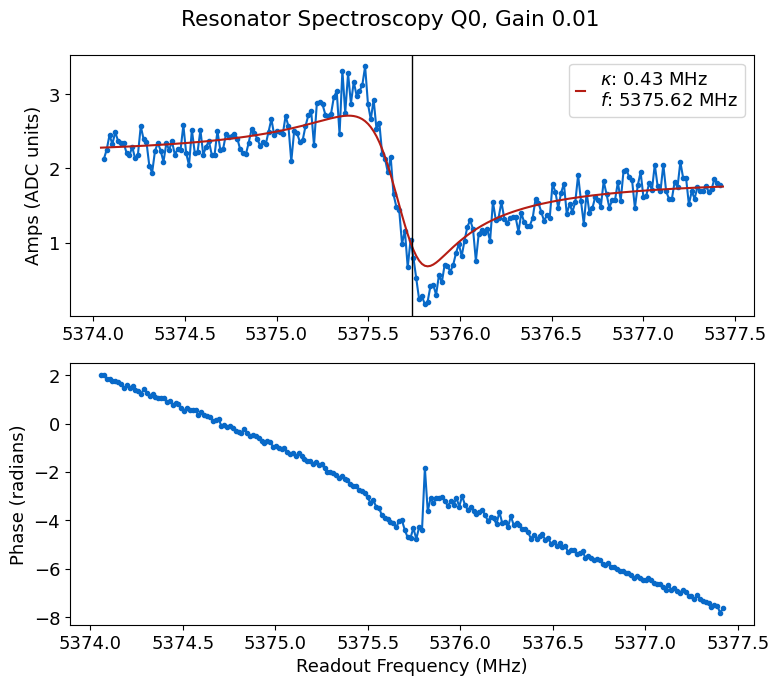

  0%|          | 0/22000 [00:00<?, ?it/s]

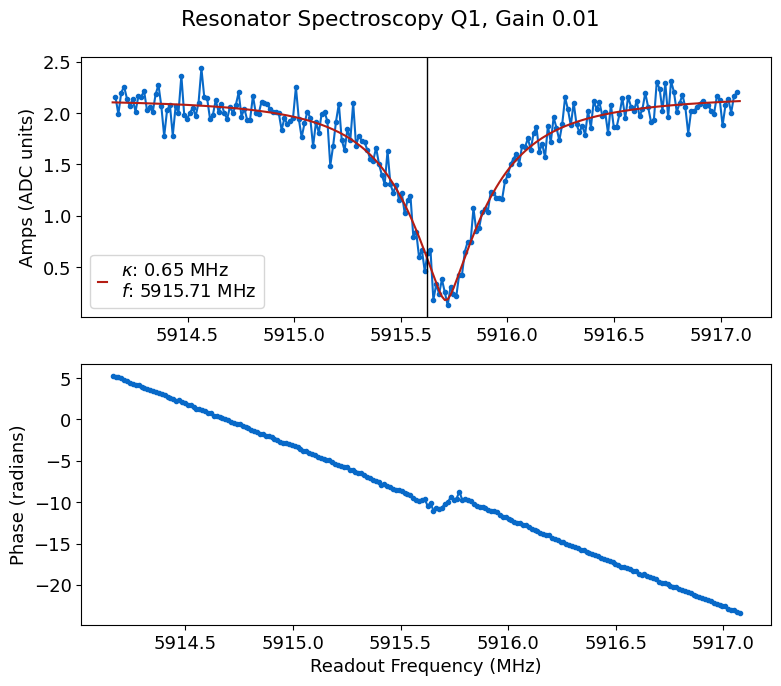

  0%|          | 0/22000 [00:00<?, ?it/s]

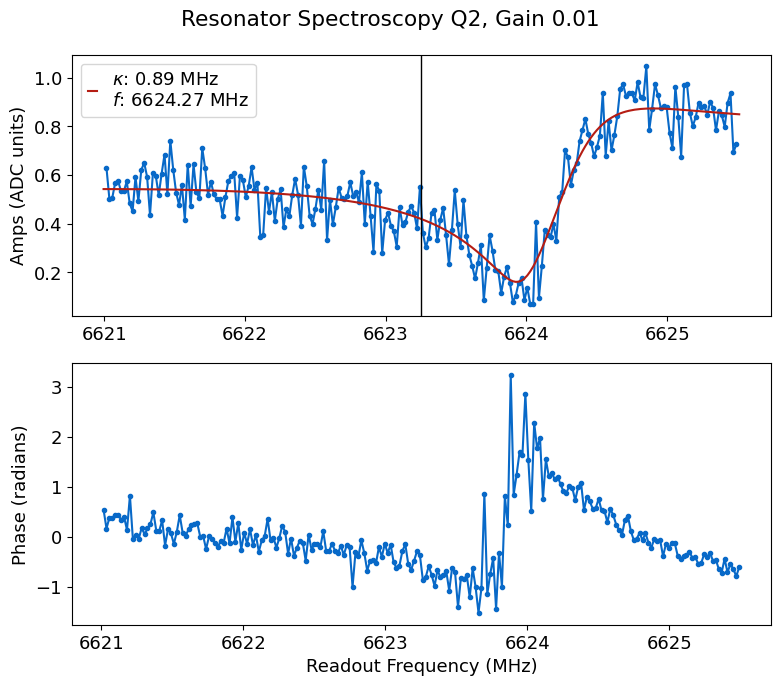

In [ ]:
update=True # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
qubit_list = np.arange(3)
qubit_list=[0]

for qi in qubit_list:    
    # Manually set the span and gain 
    #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':5, 'gain':1})

    # Fully automated, using previous fit to kappa to set span
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update(cfg_dict['cfg_file'])

### Print out scan params

In [ ]:
rspec.print()

## Resonator Power Spectroscopy 

Find a good value for gain to park your readout at until you run readout optimization. From the 2D sweep that is produced, choose a value for gain that is right before the resonator punches out. Want to choose a high value for gain because we want to be in the shot noise limited regime which increases our signal:noise ratio. 

  0%|          | 0/30 [00:00<?, ?it/s]

High power peak [MHz]: 5913.6257
Low power peak [MHz]: 5915.7348
Lamb shift [MHz]: -2.1091


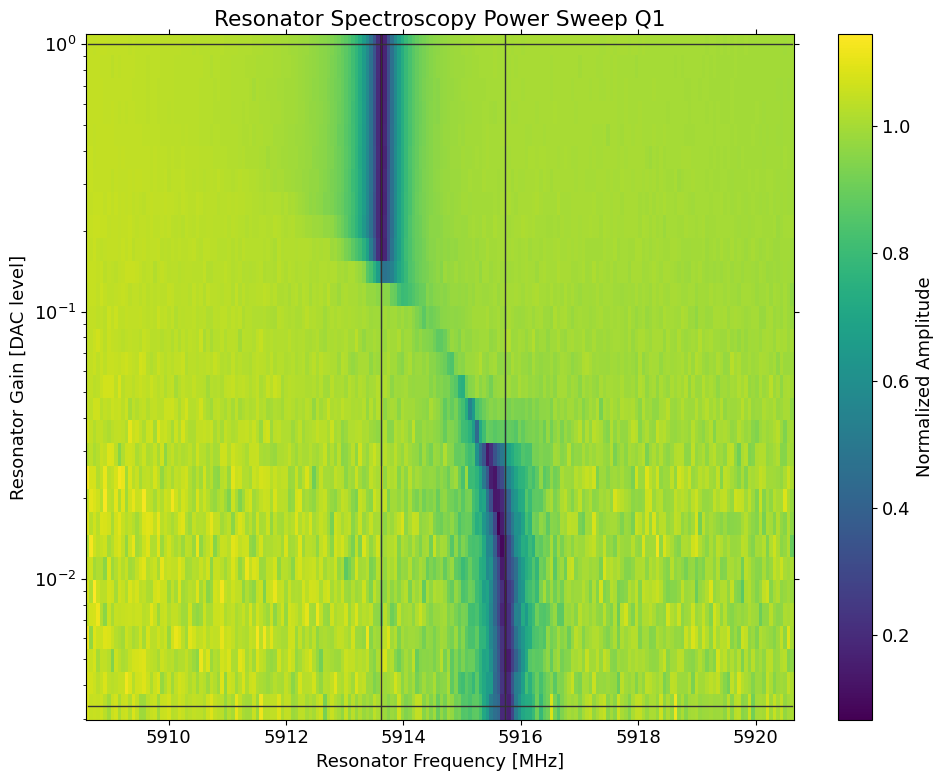

*Set cfg device.readout 1 lamb to -2.1091 from 0.0196*


  0%|          | 0/30 [00:00<?, ?it/s]

High power peak [MHz]: 6618.5053
Low power peak [MHz]: 6623.8137
Lamb shift [MHz]: -5.3084


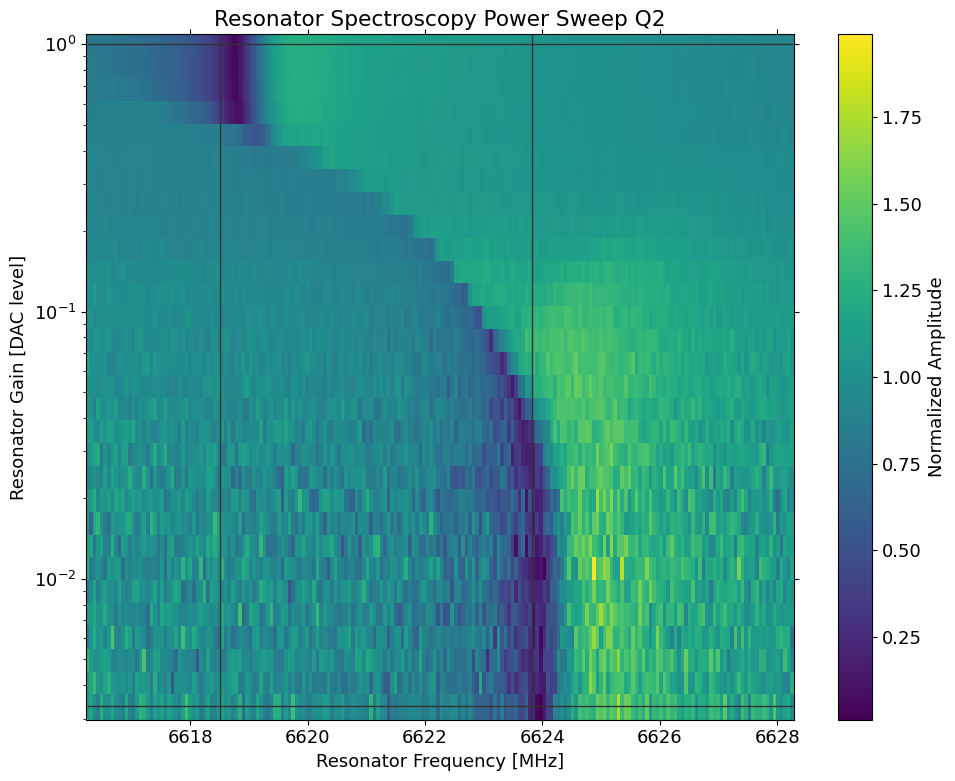

*Set cfg device.readout 2 lamb to -5.3084 from 0.7179*


In [ ]:
update=True

qubit_list = np.arange(3)
qubit_list=[1,2]

d=[]
for qi in qubit_list:
    #rpowspec=meas.ResSpecPower(cfg_dict, qi=qi)
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params={'rng':300,'max_gain':1, 'span':12,"f_off":1,'expts_gain':30})
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

### Example of plotting 2D scans for a bunch of qubits together
Can also use for varying a parameter on one qubit and plotting the results together

In [ ]:
auto_cfg = config.load(cfg_path)
horz_line = auto_cfg.device.readout.gain
handy.plot_many(d, title='Resonator Power', save_path=cfg_dict['expt_path'], chan='amps', yax='log', norm=True, horz_line=horz_line)

### Save gain values 

In [ ]:
# assign the resonator gain to the results config file
gain_values = [0.1,0.01]
for i, qi in enumerate(qubit_list):
    auto_cfg = config.update_readout(cfg_file, 'gain', gain_values[i], qi)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

Performing coarse scan


  0%|          | 0/200000 [00:00<?, ?it/s]

R2:0.491	Fit par error:0.047	 Best fit:b'avgq'


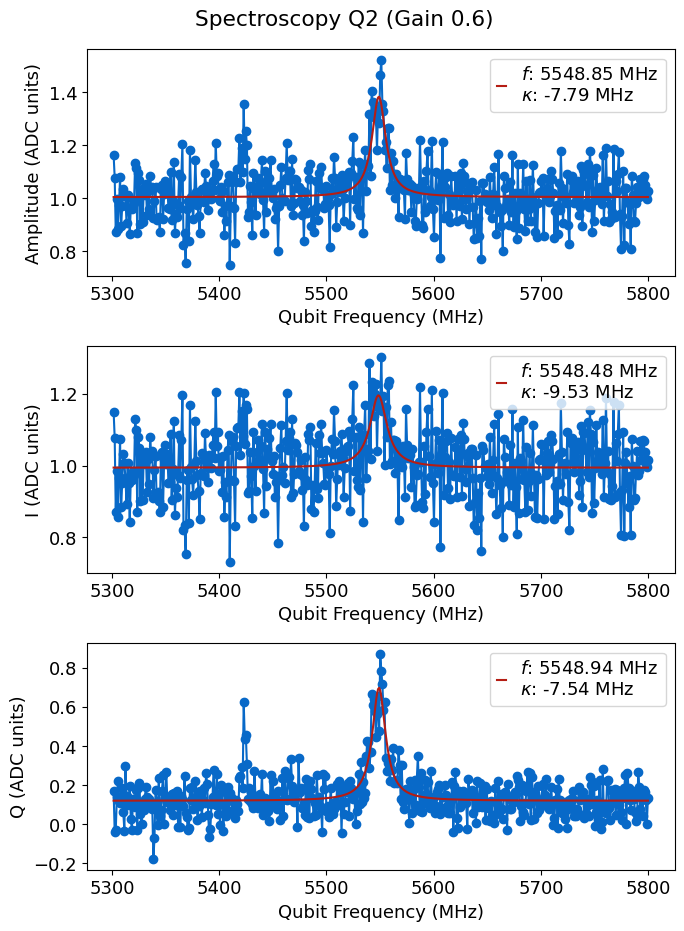

*Set cfg device.qubit 2 f_ge to 5548.9384 from 5550.6352*
Performing medium scan


  0%|          | 0/80000 [00:00<?, ?it/s]

R2:0.712	Fit par error:0.054	 Best fit:b'avgq'


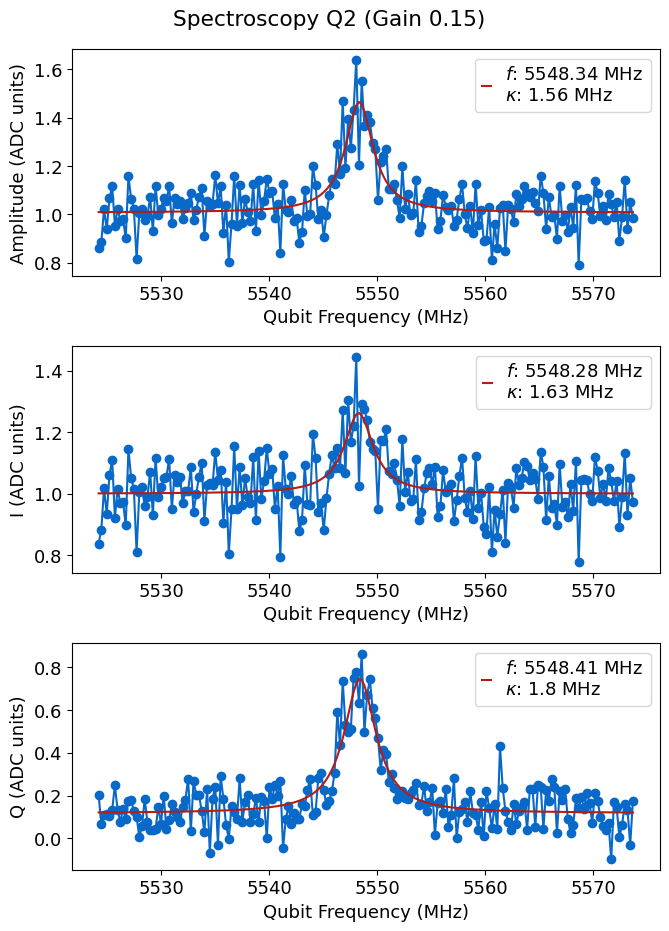

*Set cfg device.qubit 2 f_ge to 5548.4053 from 5548.9384*
Performing fine scan


  0%|          | 0/80000 [00:00<?, ?it/s]

R2:0.814	Fit par error:0.042	 Best fit:b'amps'


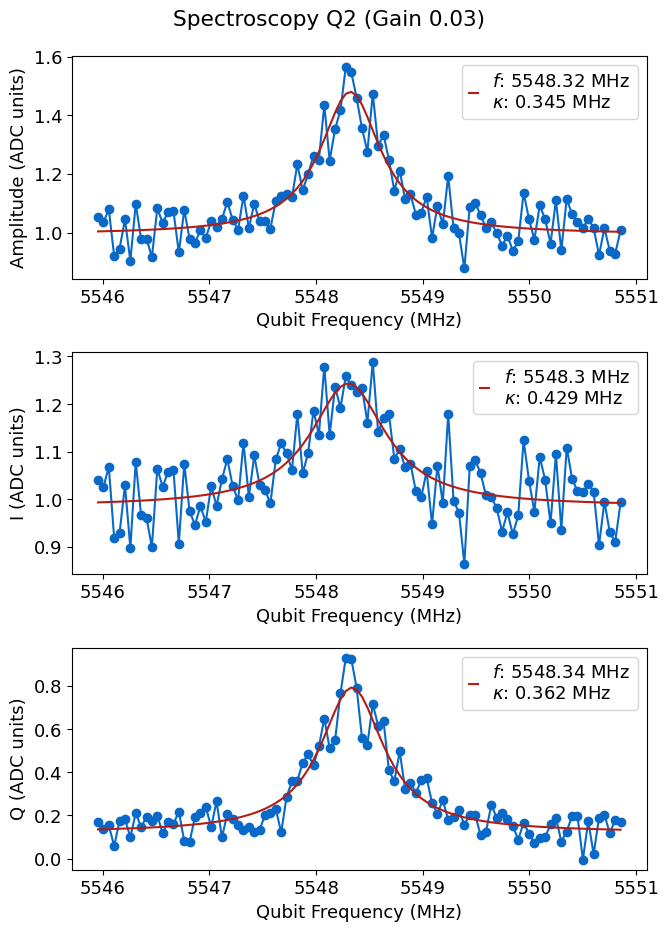

*Set cfg device.qubit 2 f_ge to 5548.321 from 5548.4053*
Found qubit 2


In [235]:
qubit_list = np.arange(3)
qubit_list= [2]

bad_qubits=[]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='coarse')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

  0%|          | 0/5000000 [00:00<?, ?it/s]

R2:0.020	Fit par error:0.085	 Best fit:b'amps'


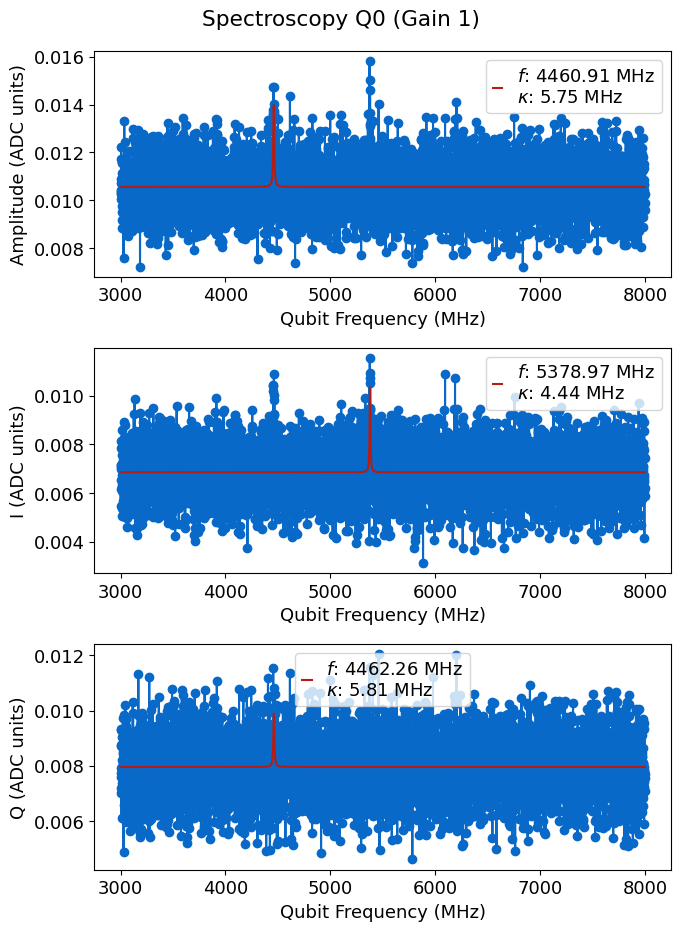

In [ ]:
update=False

#qubit_list = np.arange(3)
qubit_list = [0]

for qi in qubit_list: 
    # Default params, just specify style 
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse')

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'length':100})
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'span':100,'expts':200,'gain':1,'reps':1000,'start':3000})
    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

## Stark (still getting it working)

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/1000000 [00:00<?, ?it/s]

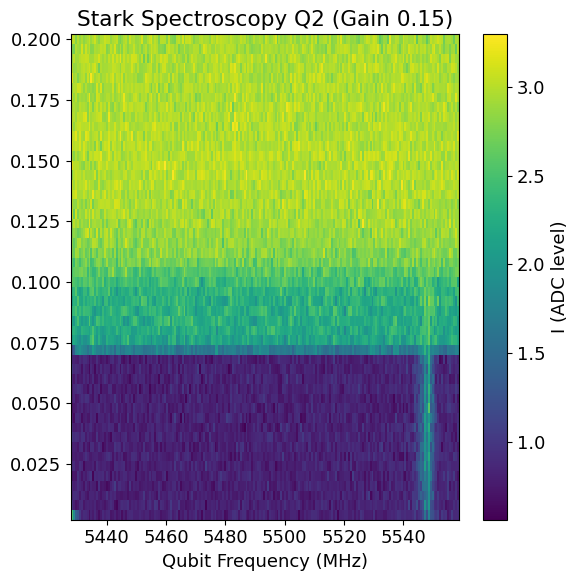

In [49]:
qi=2
qspec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params={'df_stark':0, 'max_stark_gain':0.2, 'df':-55,'span':130, 'stark_expts':50,'stark_rng':50})

## Power sweep

Unexpected parameters found in params: {'max_gain', 'log', 'expts_gain', 'rng'}


  0%|          | 0/10 [00:00<?, ?it/s]

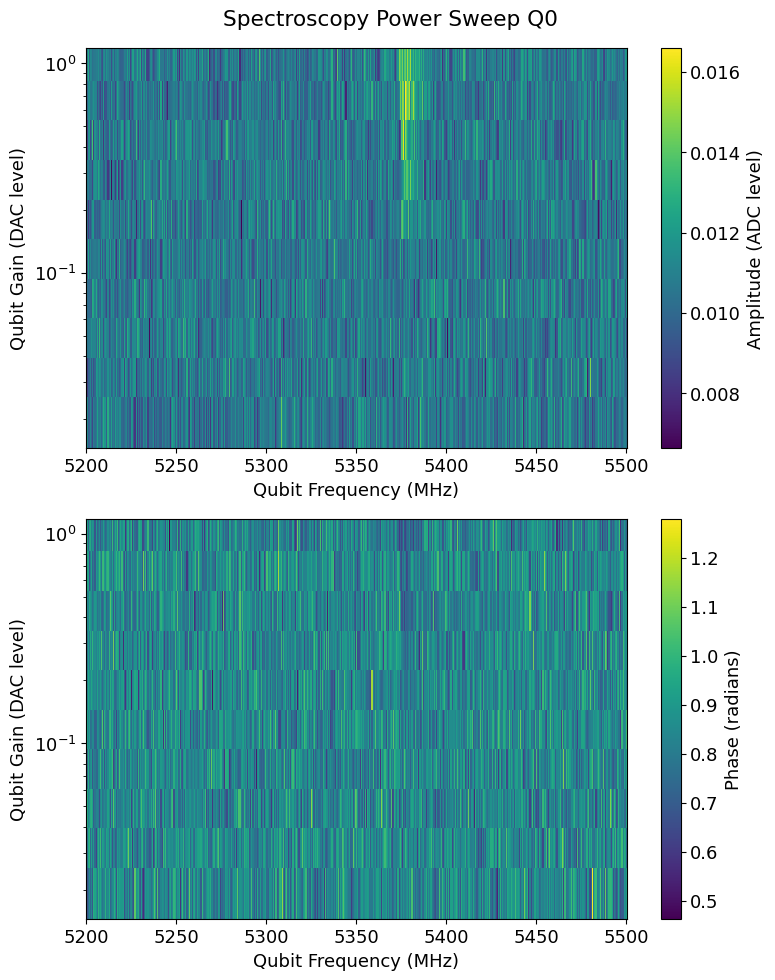

In [ ]:
qubit_list=[0]

for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':5320,'span':100,'reps':1000,'expts':200})
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

Unexpected parameters found in params: {'max_gain', 'log', 'expts_gain', 'rng'}


  0%|          | 0/10 [00:00<?, ?it/s]

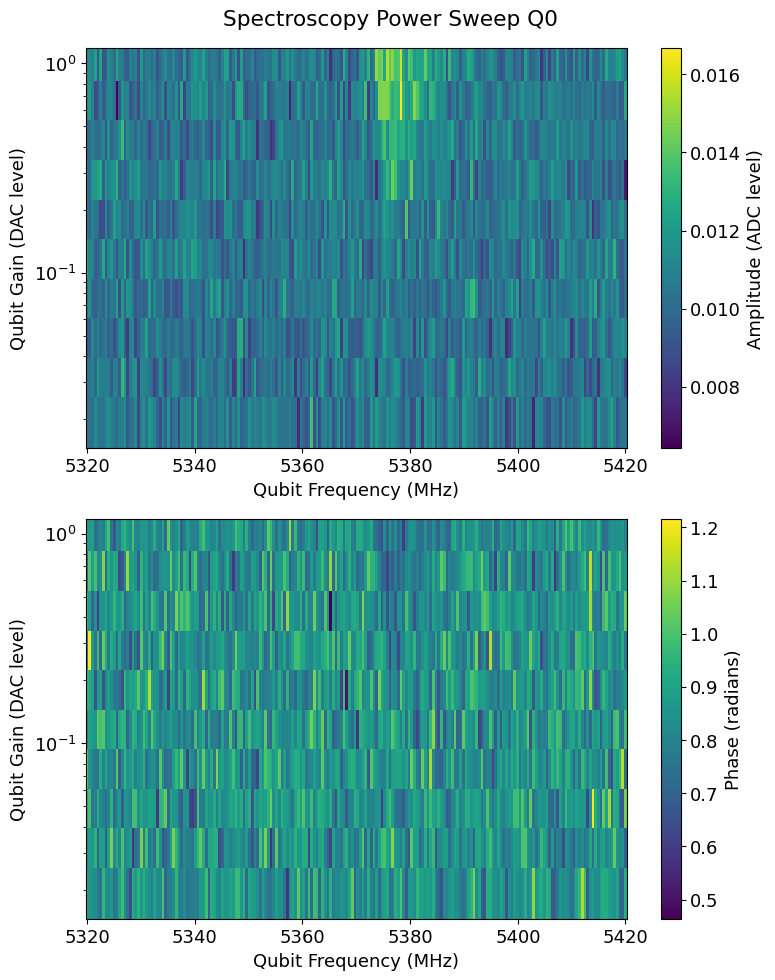

Unexpected parameters found in params: {'max_gain', 'log', 'expts_gain', 'rng'}


  0%|          | 0/10 [00:00<?, ?it/s]

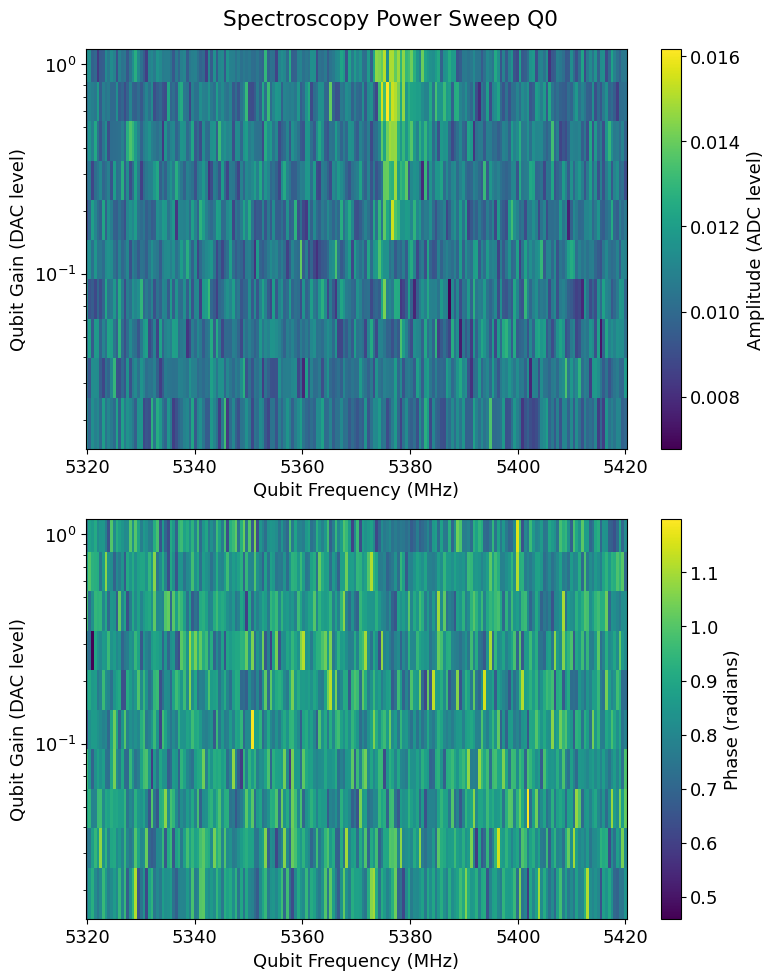

Unexpected parameters found in params: {'max_gain', 'log', 'expts_gain', 'rng'}


  0%|          | 0/10 [00:00<?, ?it/s]

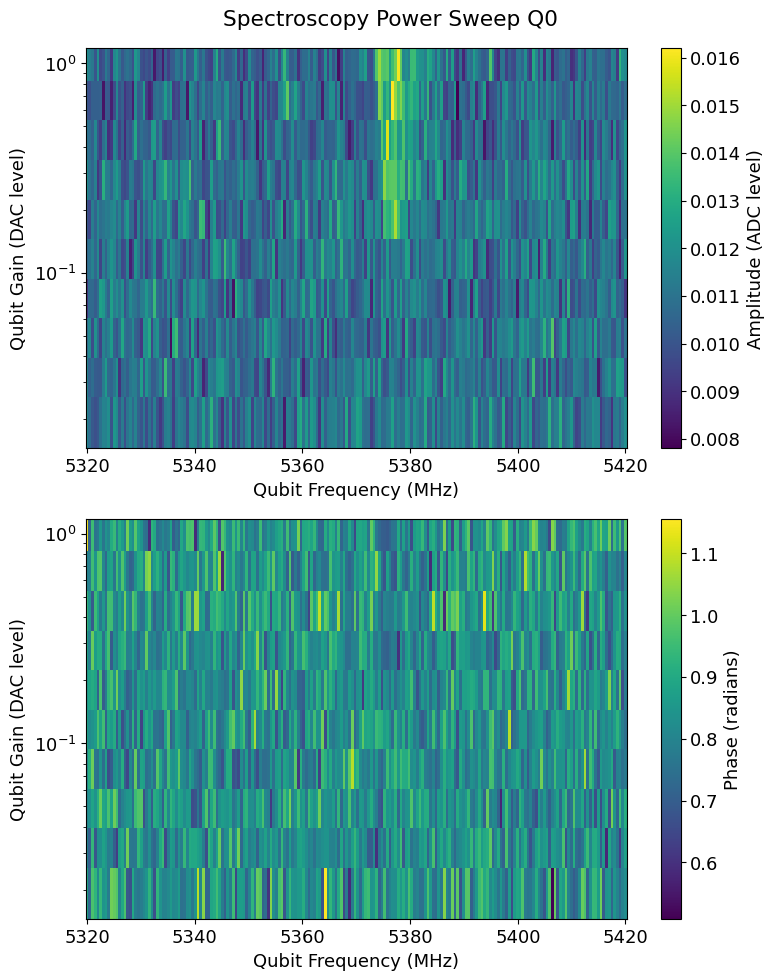

Unexpected parameters found in params: {'max_gain', 'log', 'expts_gain', 'rng'}


  0%|          | 0/10 [00:00<?, ?it/s]

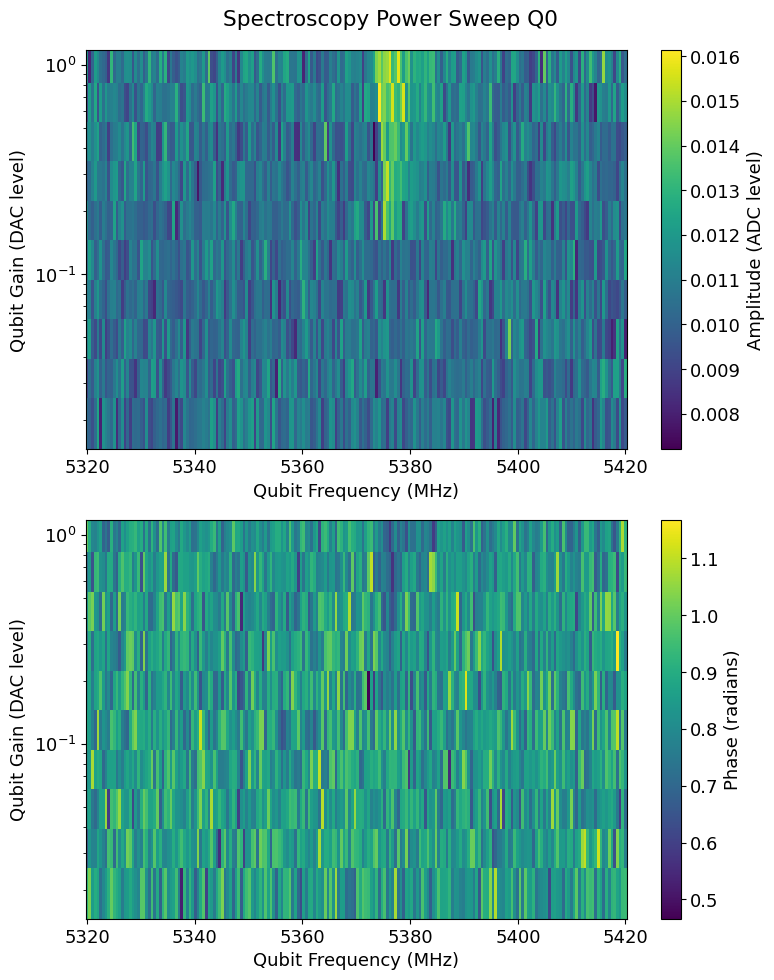

In [160]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':5320,'span':100,'reps':1000,'expts':200,'length':l})
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})

### Narrow scan

Unexpected parameters found in params: {'max_gain', 'log', 'expts_gain', 'rng'}


  0%|          | 0/10 [00:00<?, ?it/s]

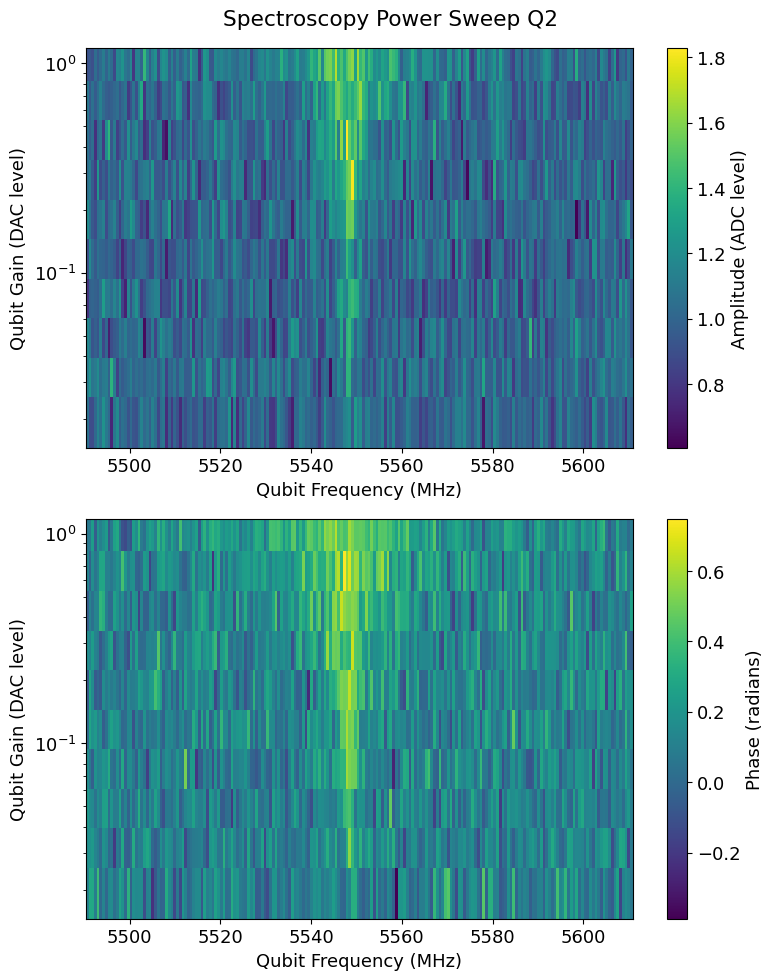

In [ ]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow')
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(20)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

  0%|          | 0/22000 [00:00<?, ?it/s]

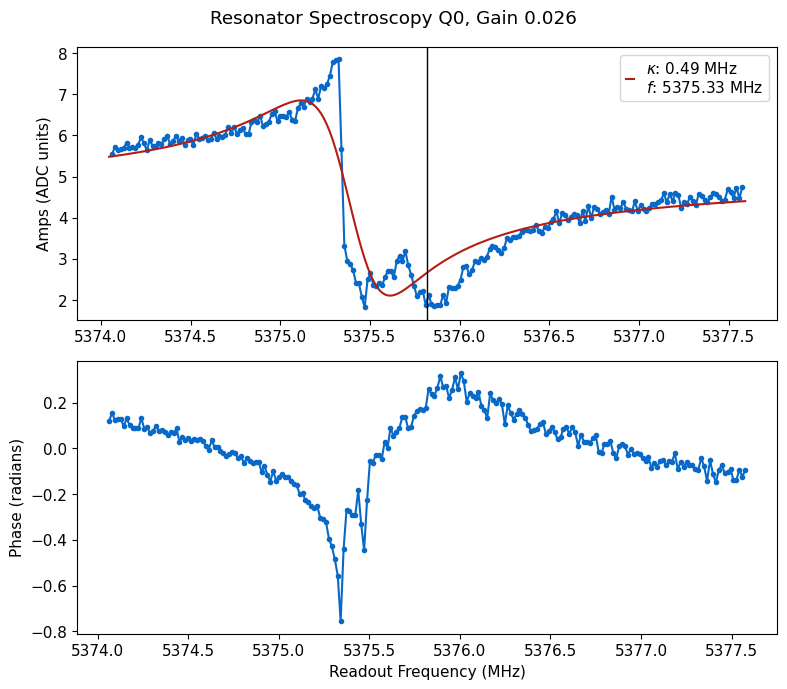

  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

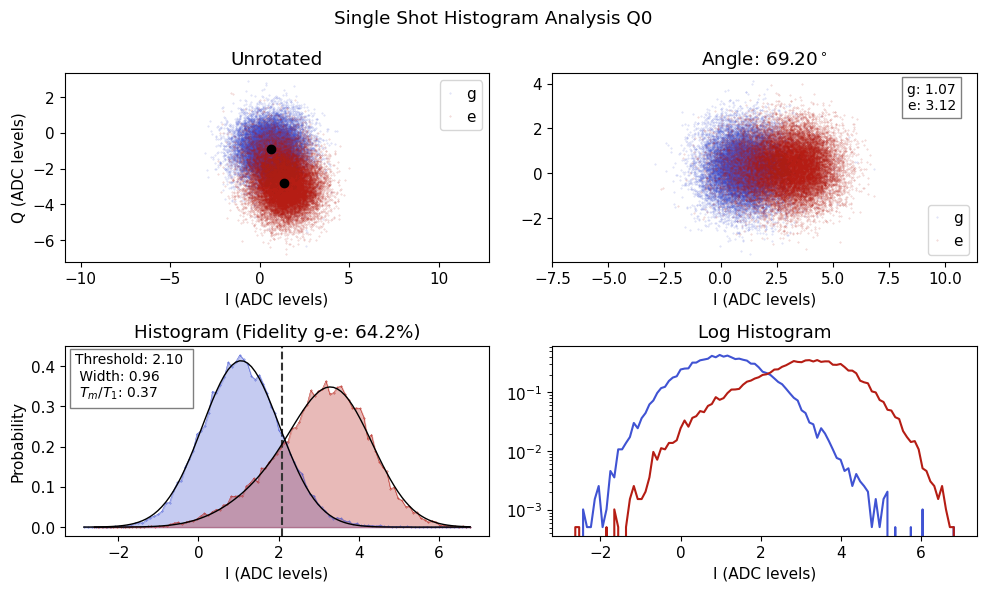

*Set cfg device.readout 0 phase to 69.1966 from 66.1136*
*Set cfg device.readout 0 threshold to 2.0975 from 2.0264*
*Set cfg device.readout 0 fidelity to 0.6424 from 0.6631*
*Set cfg device.readout 0 sigma to 0.9648 from 0.9428*
*Set cfg device.readout 0 tm to 0.375 from 0.3557*
*Set cfg device.qubit 0 tuned_up to True from True*


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.931	Fit par error:0.027	 Best fit:b'avgi'


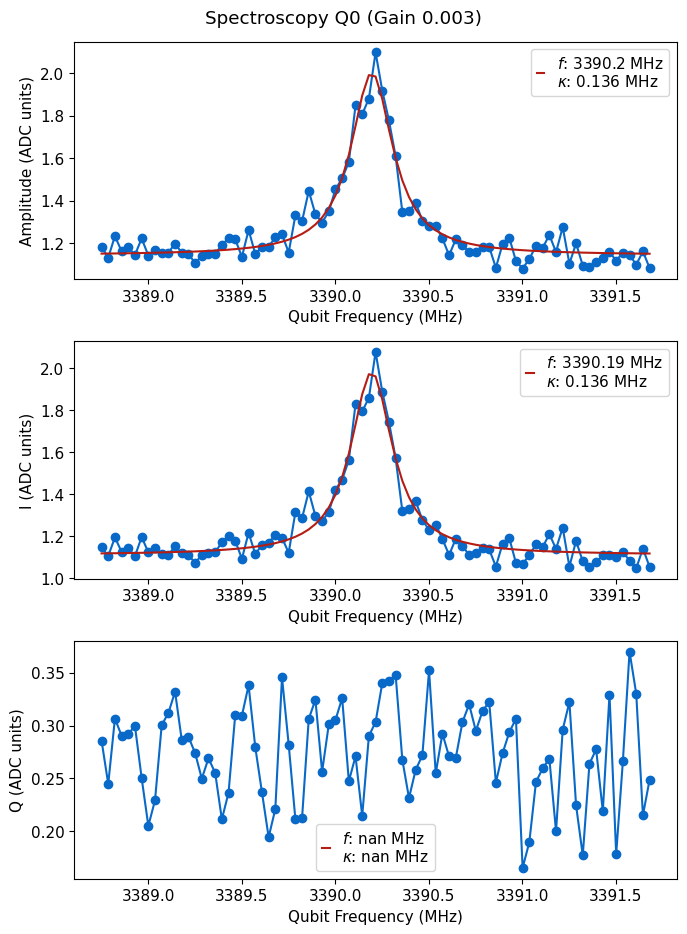

  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.957	Fit par error:0.014	 Best fit:b'avgi'


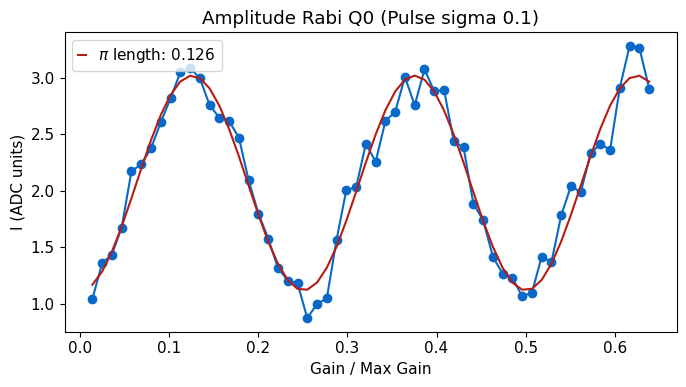

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1259 from 0.1299*
Try 0


  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.864	Fit par error:0.034	 Best fit:b'avgi'


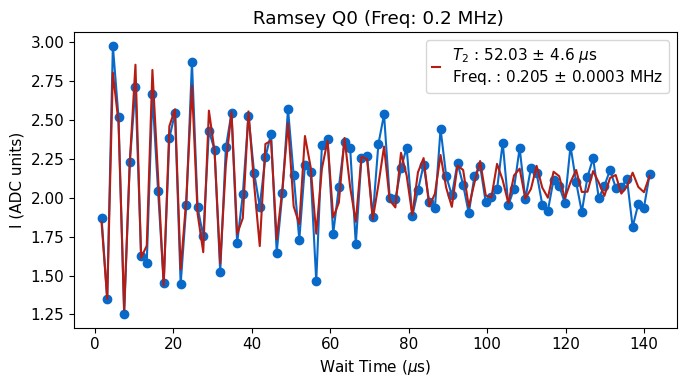

Scan successful. New frequency error is -0.005 MHz
*Set cfg device.qubit 0 f_ge to 3390.2112 from 3390.2158*
*Set cfg device.qubit 0 T2r to 52.0332 from 47.56*
Total Change in frequency: -0.005 MHz
[-0.004638137276811893]
Qubit 0 recentered from 3390.2158 to 3390.2112


  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.955	Fit par error:0.021	 Best fit:b'avgi'


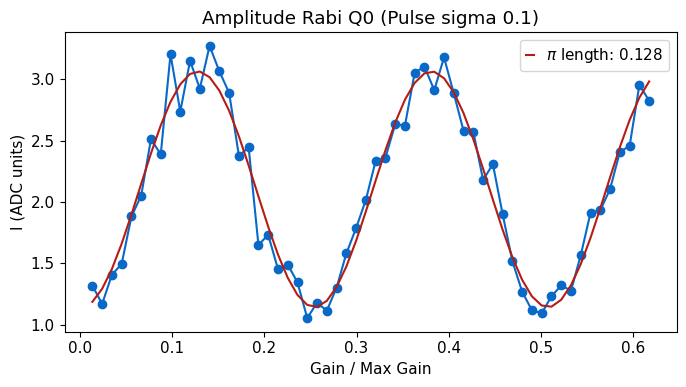

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1279 from 0.1259*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

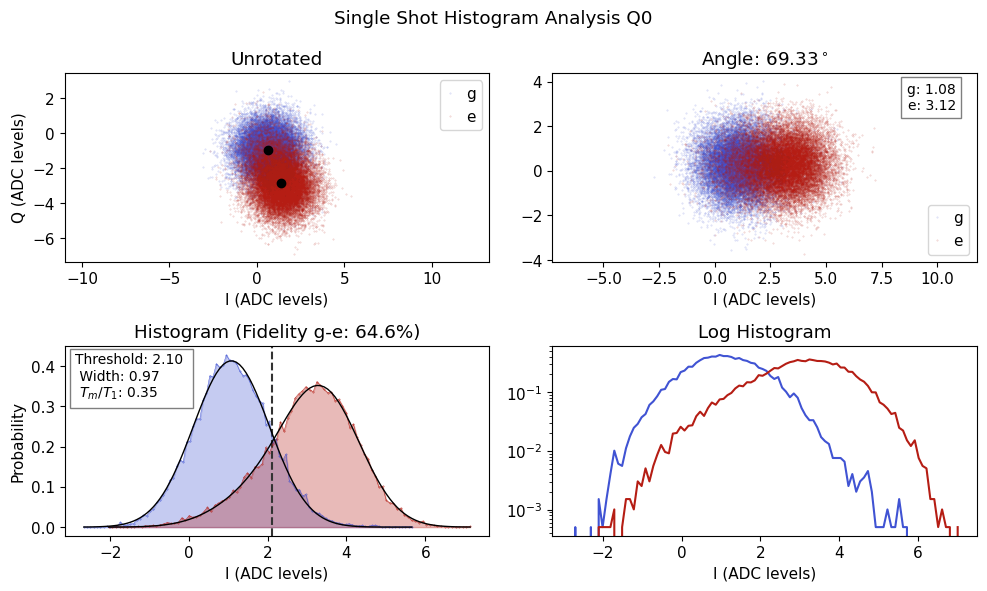

*Set cfg device.readout 0 phase to 69.3253 from 69.1966*
*Set cfg device.readout 0 threshold to 2.1024 from 2.0975*
*Set cfg device.readout 0 fidelity to 0.6464 from 0.6424*
*Set cfg device.readout 0 sigma to 0.9651 from 0.9648*
*Set cfg device.readout 0 tm to 0.3536 from 0.375*
*Set cfg device.qubit 0 tuned_up to True from True*


  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.846	Fit par error:0.047	 Best fit:b'avgi'


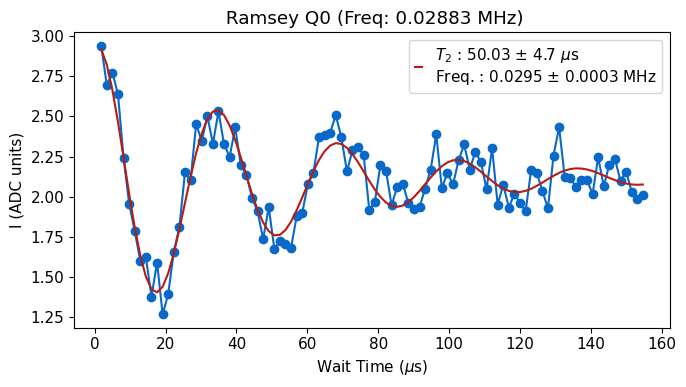

*Set cfg device.qubit 0 T2r to 50.03 from 52.0332*


  0%|          | 0/12000 [00:00<?, ?it/s]

R2:0.973	Fit par error:0.034	 Best fit:b'avgi'


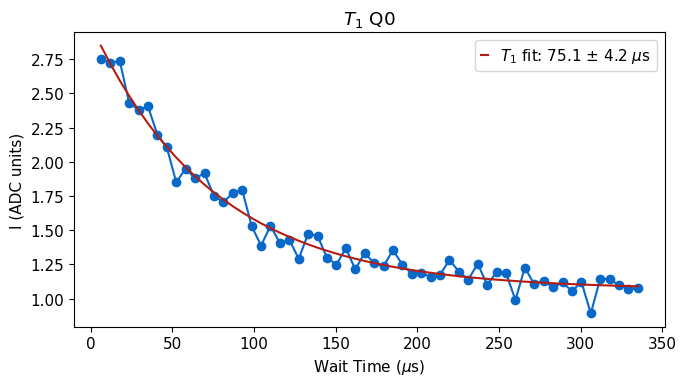

*Set cfg device.qubit 0 T1 to 75.11 from 91.99*
*Set cfg device.readout 0 final_delay to 450.64 from 551.92*


  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.938	Fit par error:0.035	 Best fit:b'avgi'


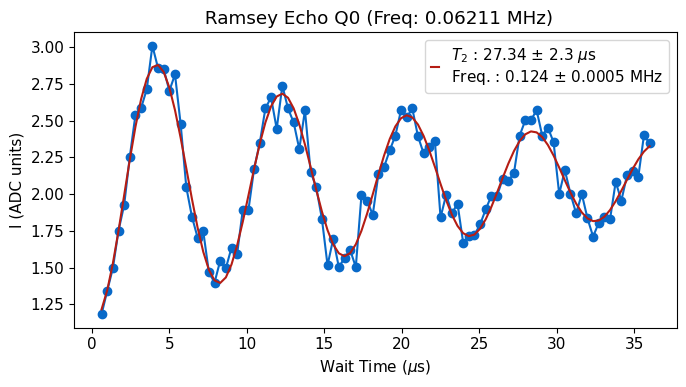

*Set cfg device.qubit 0 T2e to 27.34 from 24.15*


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

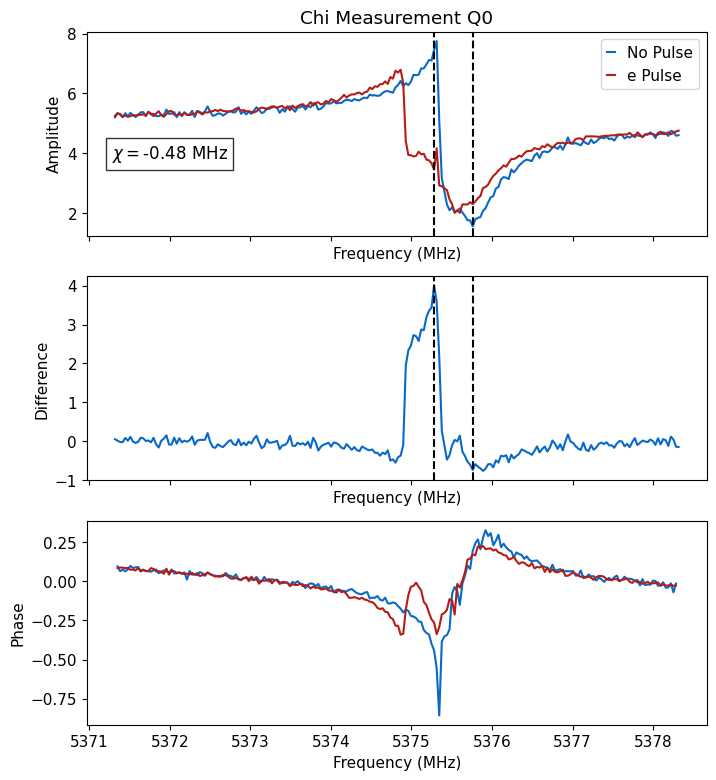

*Set cfg device.readout 0 chi to -0.4792 from -0.4473*


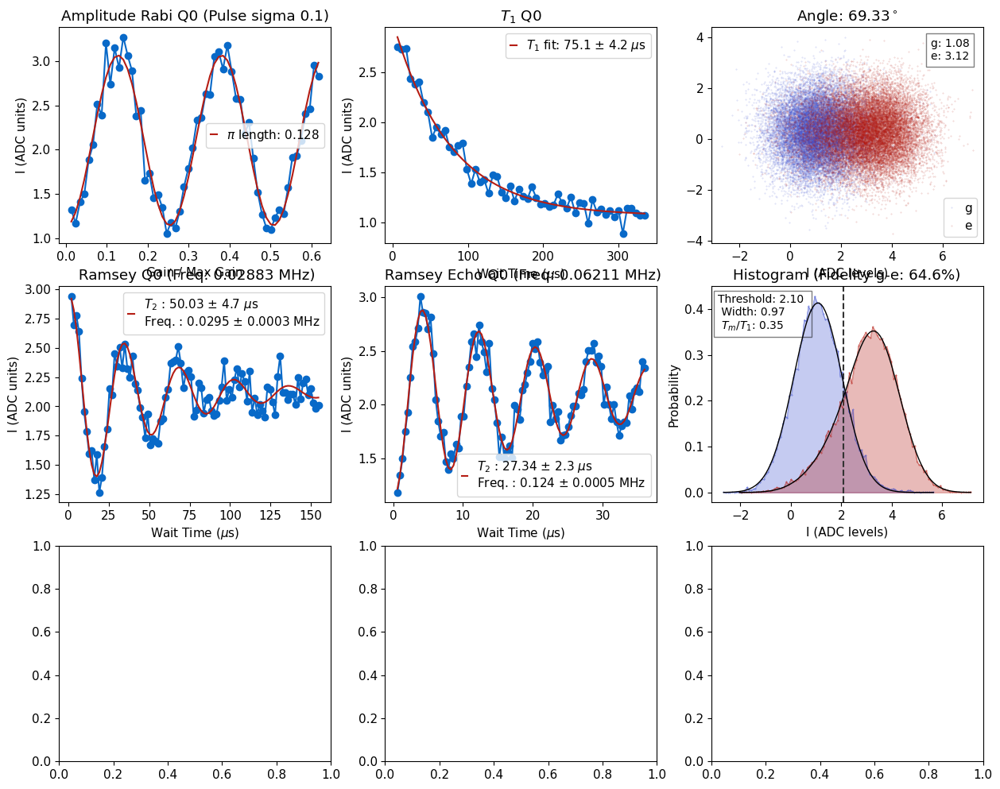

<Figure size 800x400 with 0 Axes>

C:\_Data\Lairon\2025_06_16\images\summary\qubit0_tuneup_20250621_0704.png


  0%|          | 0/44000 [00:00<?, ?it/s]

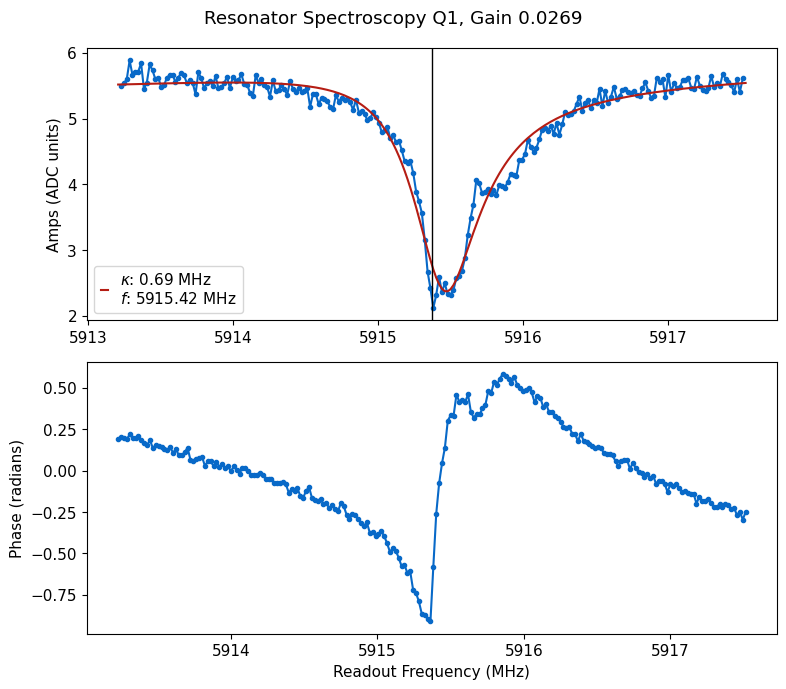

*Set cfg device.readout 1 frequency to 5915.3819 from 5915.3729*
*Set cfg device.readout 1 kappa to 0.6937 from 0.6183*
*Set cfg device.readout 1 qi to 2.0636 from 3.2411*
*Set cfg device.readout 1 qe to 1.4534 from 1.3575*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

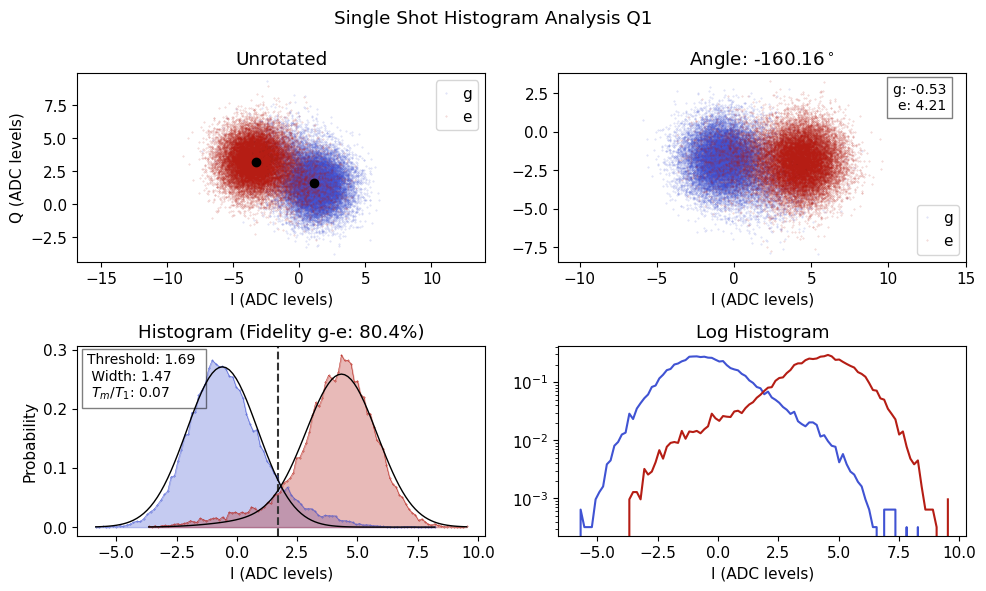

*Set cfg device.readout 1 phase to -160.157 from -25.2362*
*Set cfg device.readout 1 threshold to 1.6873 from 1.5874*
*Set cfg device.readout 1 fidelity to 0.8043 from 0.8265*
*Set cfg device.readout 1 sigma to 1.4713 from 1.4281*
*Set cfg device.readout 1 tm to 0.0745 from 0.0688*
*Set cfg device.qubit 1 tuned_up to True from True*


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.879	Fit par error:0.035	 Best fit:b'amps'


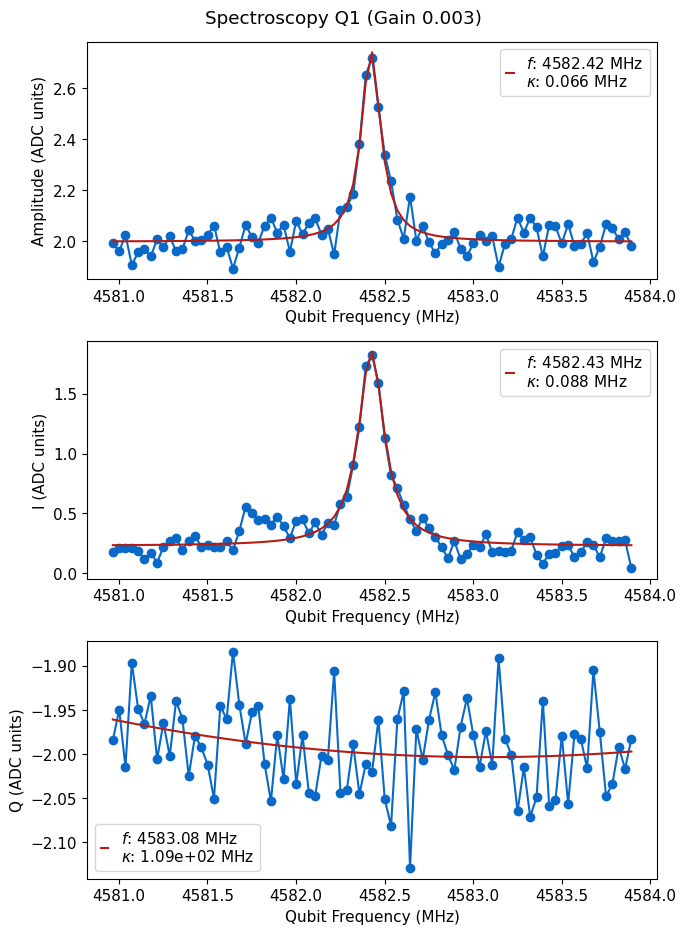

  0%|          | 0/12000 [00:00<?, ?it/s]

R2:0.988	Fit par error:0.012	 Best fit:b'avgi'


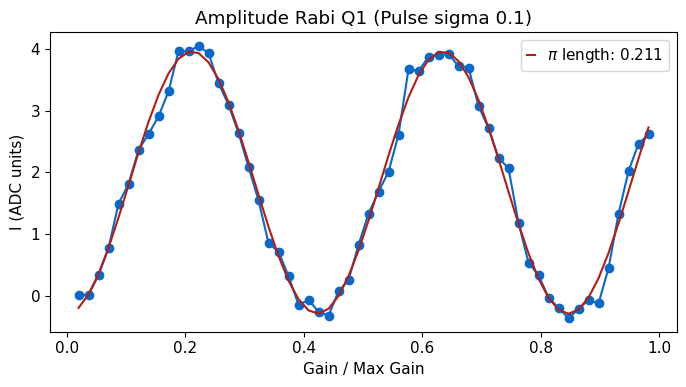

*Set cfg device.qubit 1 ('pulses', 'pi_ge', 'gain') to 0.2115 from 0.2029*
Try 0


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.953	Fit par error:0.024	 Best fit:b'avgi'


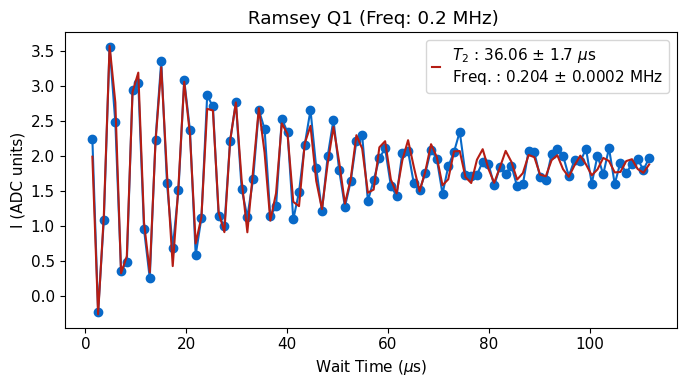

Scan successful. New frequency error is -0.004 MHz
*Set cfg device.qubit 1 f_ge to 4582.4255 from 4582.4298*
*Set cfg device.qubit 1 T2r to 36.0573 from 37.58*
Total Change in frequency: -0.004 MHz
[-0.004318013092017681]
Qubit 1 recentered from 4582.4298 to 4582.4255


  0%|          | 0/12000 [00:00<?, ?it/s]

R2:0.990	Fit par error:0.011	 Best fit:b'avgi'


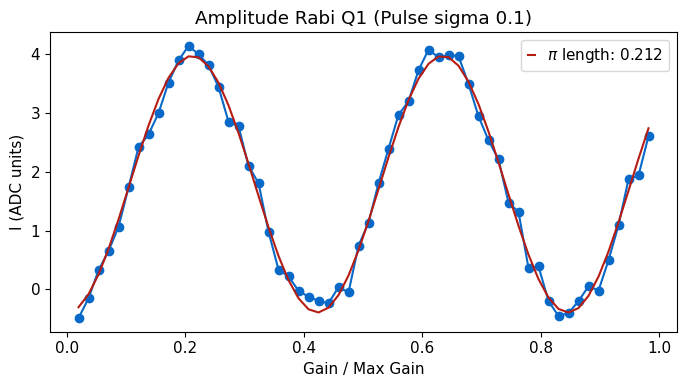

*Set cfg device.qubit 1 ('pulses', 'pi_ge', 'gain') to 0.2118 from 0.2115*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

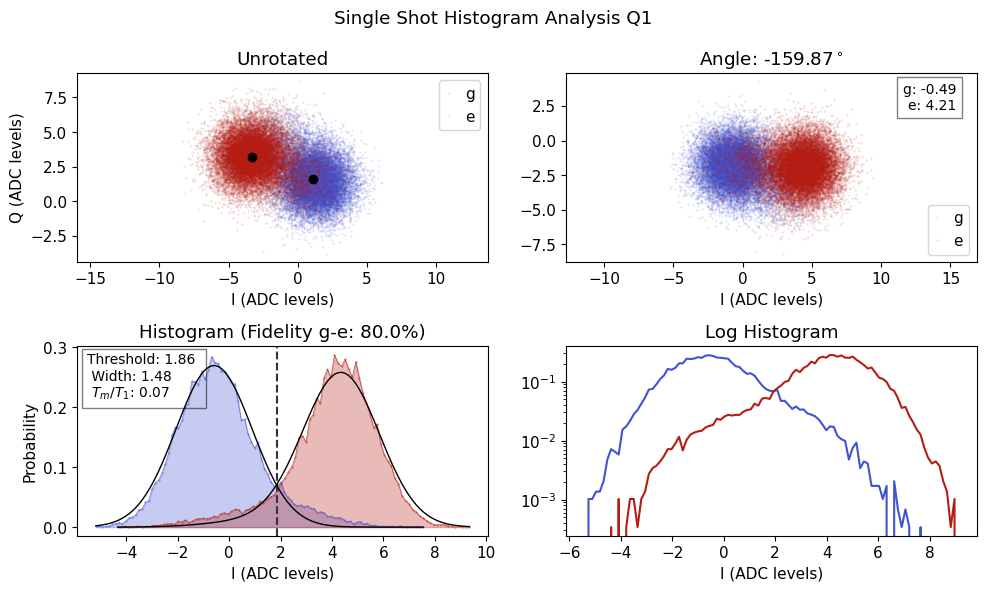

*Set cfg device.readout 1 phase to -159.8725 from -160.157*
*Set cfg device.readout 1 threshold to 1.8578 from 1.6873*
*Set cfg device.readout 1 fidelity to 0.7996 from 0.8043*
*Set cfg device.readout 1 sigma to 1.4806 from 1.4713*
*Set cfg device.readout 1 tm to 0.0688 from 0.0745*
*Set cfg device.qubit 1 tuned_up to True from True*


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.942	Fit par error:0.029	 Best fit:b'avgi'


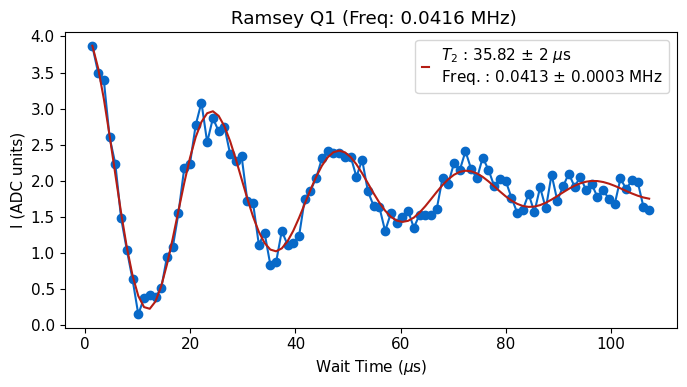

*Set cfg device.qubit 1 T2r to 35.82 from 36.0573*


  0%|          | 0/24000 [00:00<?, ?it/s]

R2:0.992	Fit par error:0.055	 Best fit:b'avgi'


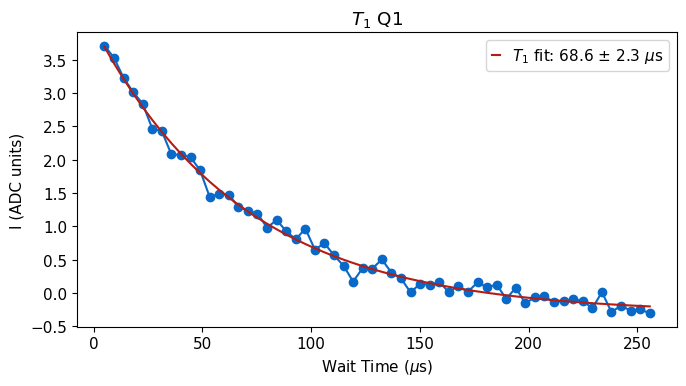

*Set cfg device.qubit 1 T1 to 68.59 from 70.17*
*Set cfg device.readout 1 final_delay to 411.56 from 421.03*


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.980	Fit par error:0.020	 Best fit:b'avgi'


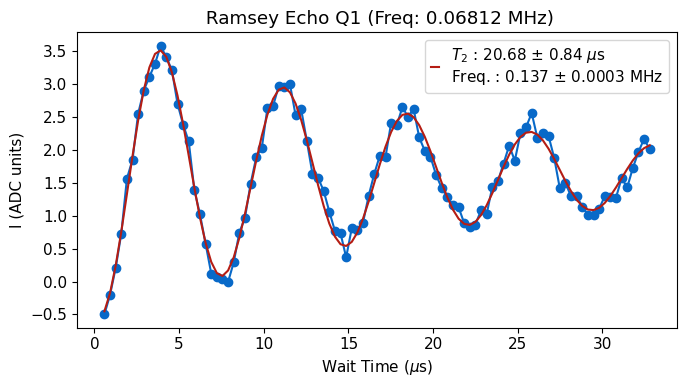

*Set cfg device.qubit 1 T2e to 20.68 from 22.02*


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

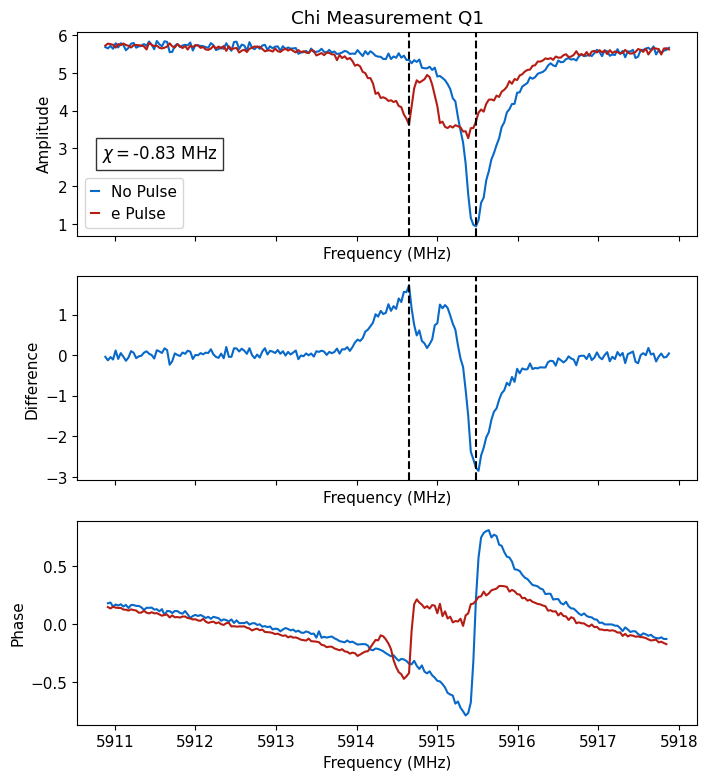

*Set cfg device.readout 1 chi to -0.8307 from -0.7987*


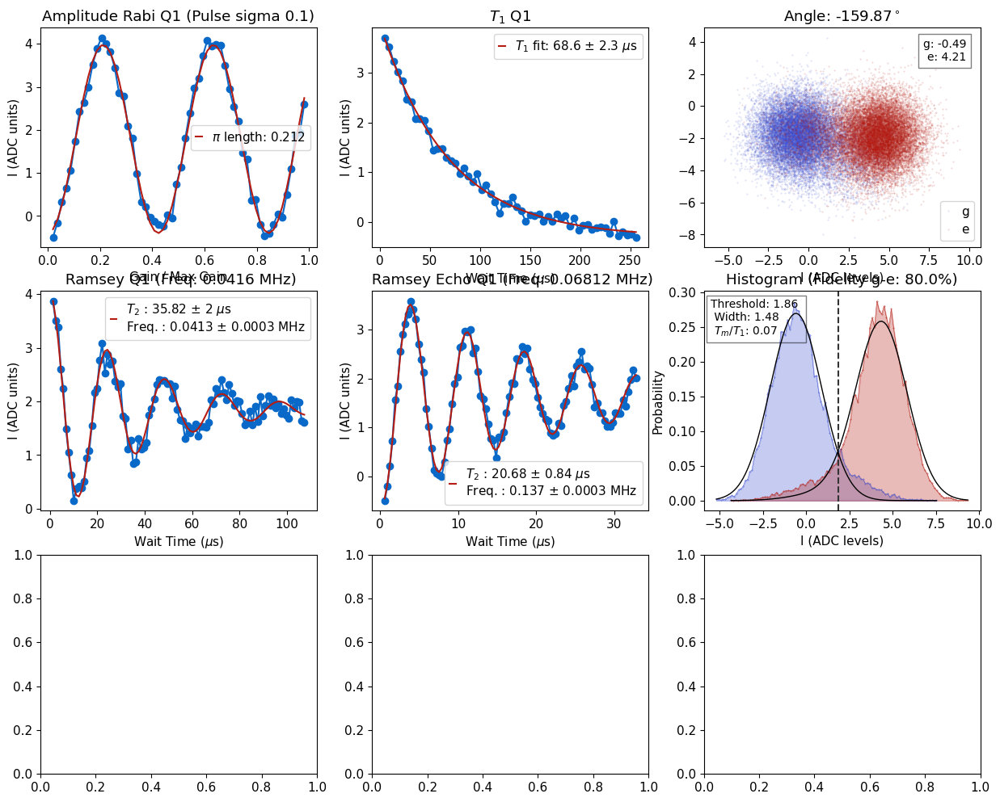

<Figure size 800x400 with 0 Axes>

C:\_Data\Lairon\2025_06_16\images\summary\qubit1_tuneup_20250621_0707.png


  0%|          | 0/44000 [00:00<?, ?it/s]

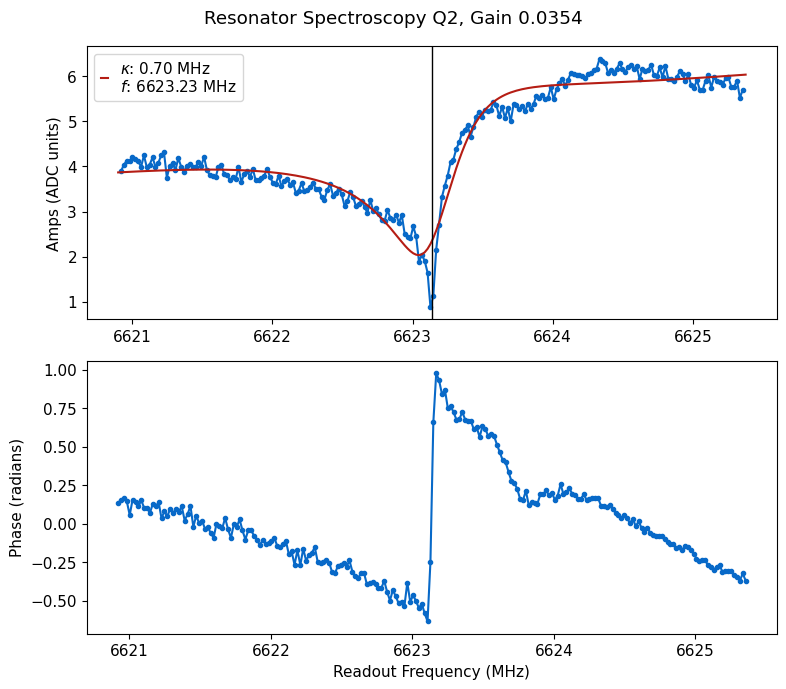

*Set cfg device.readout 2 frequency to 6623.1278 from 6623.1401*
*Set cfg device.readout 2 kappa to 0.7018 from 0.6399*
*Set cfg device.readout 2 qi to 3.0212 from 3.3714*
*Set cfg device.readout 2 qe to 1.3726 from 1.4935*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

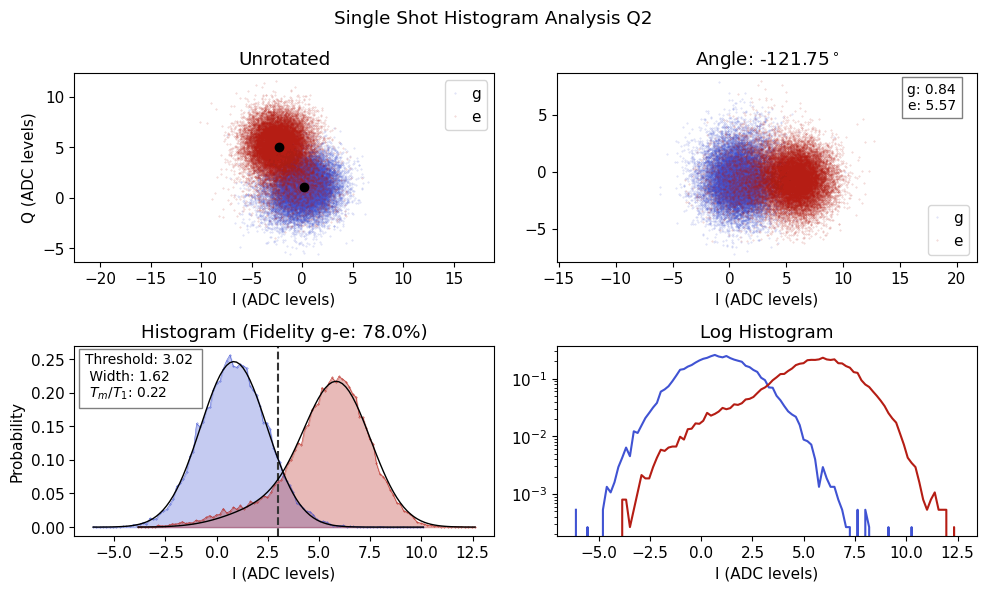

*Set cfg device.readout 2 phase to -121.7474 from 38.113*
*Set cfg device.readout 2 threshold to 3.0164 from 3.0875*
*Set cfg device.readout 2 fidelity to 0.7803 from 0.8356*
*Set cfg device.readout 2 sigma to 1.6204 from 1.6181*
*Set cfg device.readout 2 tm to 0.216 from 0.0675*
*Set cfg device.qubit 2 tuned_up to True from True*


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.978	Fit par error:0.018	 Best fit:b'amps'


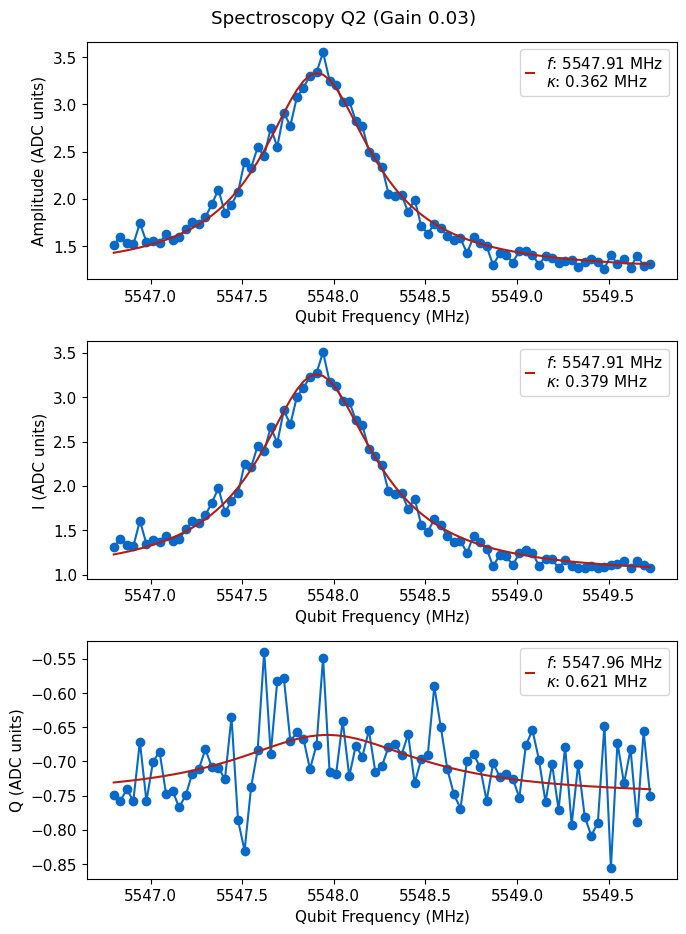

Qubit frequency is off spectroscopy by more than 250 kHz, recentering
*Set cfg device.qubit 2 f_ge to 5547.9089 from 5548.2629*


  0%|          | 0/12000 [00:00<?, ?it/s]

R2:0.969	Fit par error:0.029	 Best fit:b'avgi'


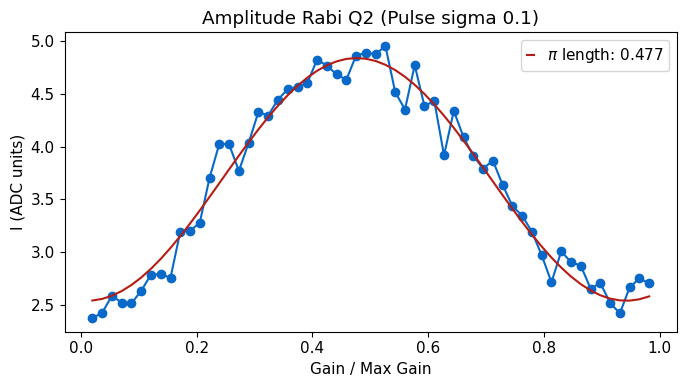

*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.4766 from 0.4608*
Try 0


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.517	Fit par error:880273.132	 Best fit:b'avgi'
R2:0.517	Fit par error:59.667	 Best fit:b'avgi'


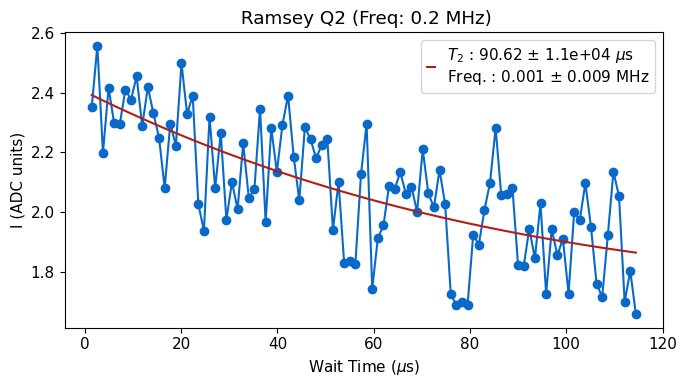

Frequency error too high, increasing frequency
Try 1


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.708	Fit par error:18845.317	 Best fit:b'avgi'
R2:0.708	Fit par error:46.868	 Best fit:b'avgi'


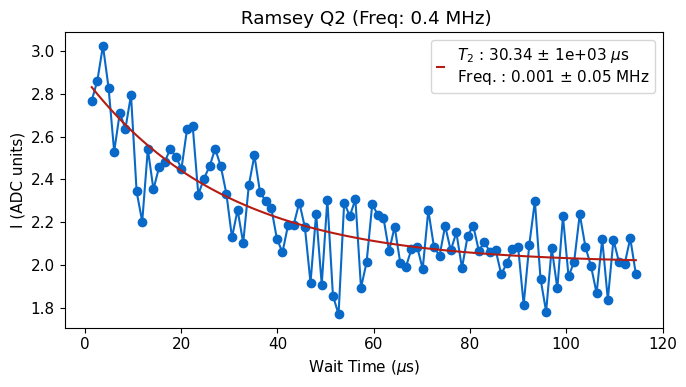

Frequency error too high, increasing frequency
Try 2


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:nan	Fit par error:nan	 Best fit:b'avgi'
R2:0.813	Fit par error:1.752	 Best fit:b'avgi'


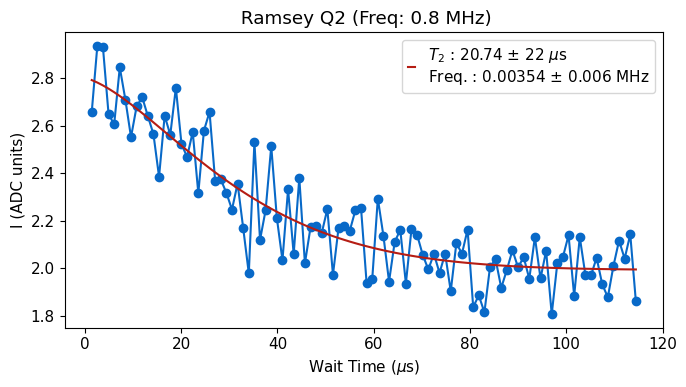

Frequency error too high, increasing frequency
Total Change in frequency: 0.000 MHz
[]
Qubit 2 failed to recenter from 5547.9089 to 5547.9089


  0%|          | 0/12000 [00:00<?, ?it/s]

R2:0.959	Fit par error:0.038	 Best fit:b'avgi'


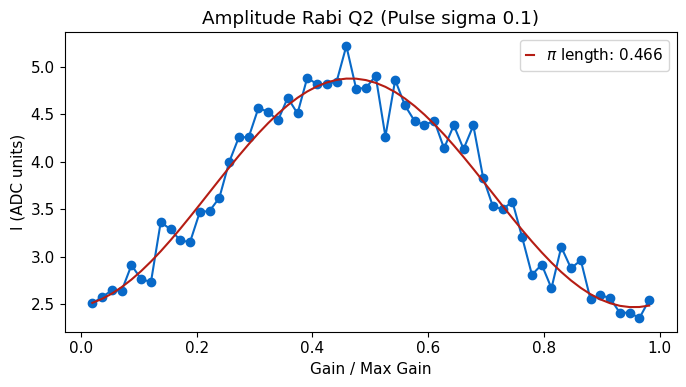

*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.4662 from 0.4766*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

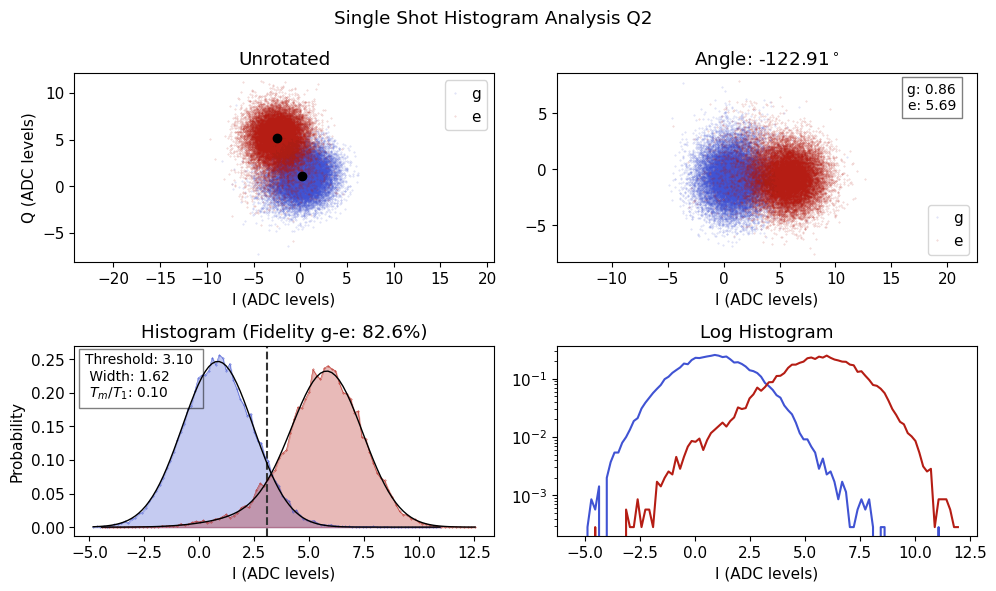

*Set cfg device.readout 2 phase to -122.906 from -121.7474*
*Set cfg device.readout 2 threshold to 3.0981 from 3.0164*
*Set cfg device.readout 2 fidelity to 0.8256 from 0.7803*
*Set cfg device.readout 2 sigma to 1.6179 from 1.6204*
*Set cfg device.readout 2 tm to 0.1018 from 0.216*
*Set cfg device.qubit 2 tuned_up to True from True*


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.425	Fit par error:1070496.661	 Best fit:b'avgi'
R2:0.425	Fit par error:135.403	 Best fit:b'avgi'


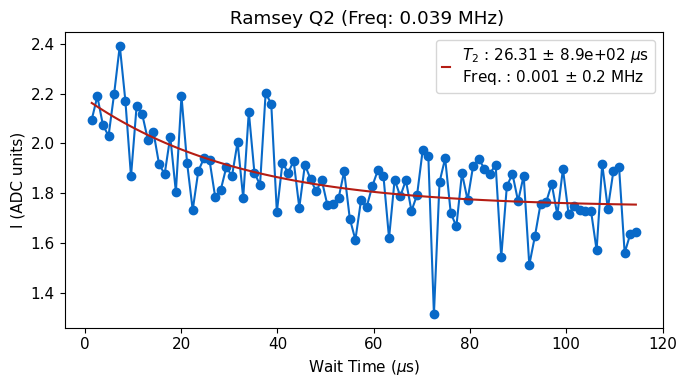

Fit Error too high


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.245	Fit par error:0.332	 Best fit:b'avgi'


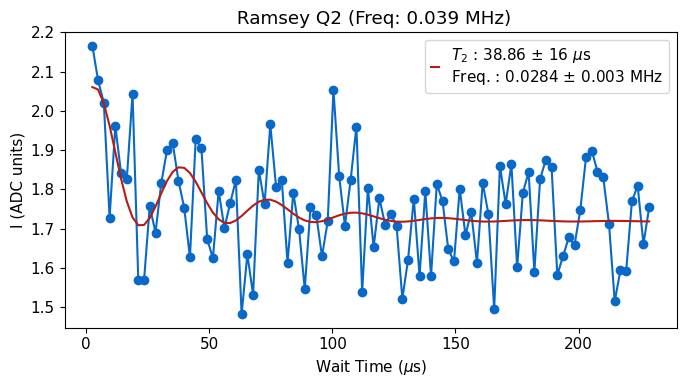

*Set cfg device.qubit 2 T2r to 38.86 from 38.46*


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.309	Fit par error:4048.526	 Best fit:b'avgi'
R2:0.309	Fit par error:82.534	 Best fit:b'avgi'


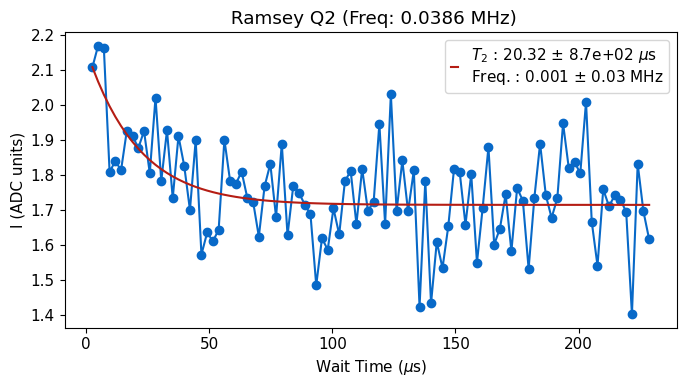

Fit Error too high


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.363	Fit par error:1692.308	 Best fit:b'avgi'
R2:0.327	Fit par error:1.742	 Best fit:b'avgi'


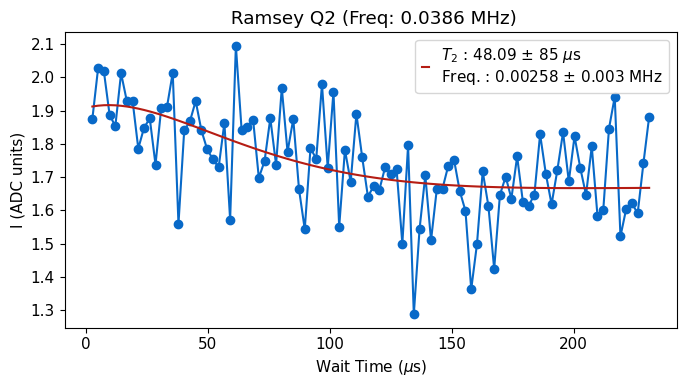

Fit Error too high


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.209	Fit par error:419309.459	 Best fit:b'avgi'
R2:0.208	Fit par error:12.792	 Best fit:b'avgi'


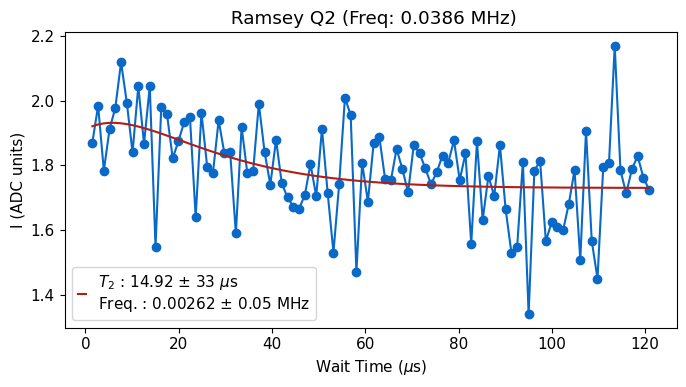

Fit Error too high


  0%|          | 0/24000 [00:00<?, ?it/s]

R2:0.989	Fit par error:0.032	 Best fit:b'avgi'


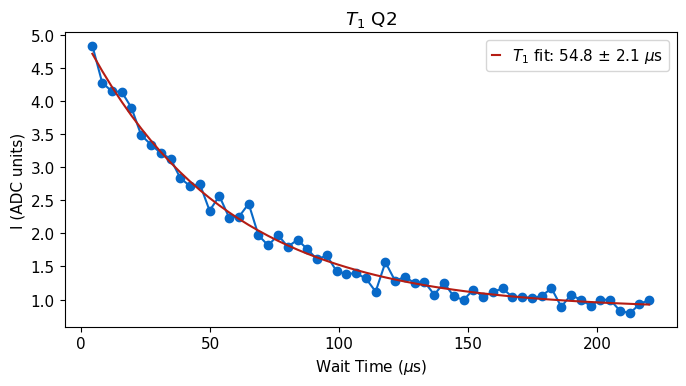

*Set cfg device.qubit 2 T1 to 54.76 from 60.41*
*Set cfg device.readout 2 final_delay to 328.58 from 362.46*


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.192	Fit par error:333869.096	 Best fit:b'avgi'
R2:0.190	Fit par error:2.800	 Best fit:b'avgi'


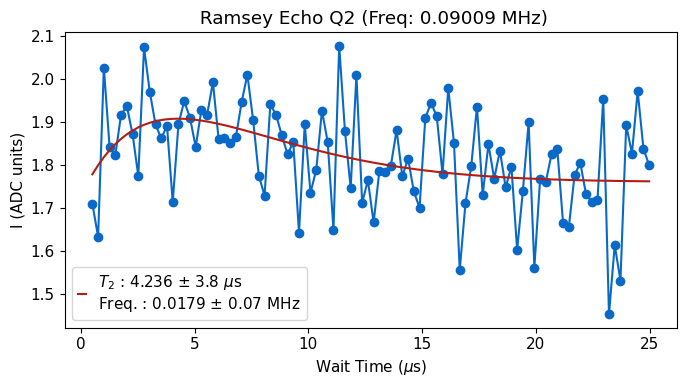

Fit Error too high


  0%|          | 0/40000 [00:00<?, ?it/s]

c:\_Lib\python\slab_qick_calib\notebooks\..\gen\qick_experiment.py:260: RuntimeWarning: invalid value encountered in sqrt
  data["fit_err_par"] = np.sqrt(np.diag(fit_err)) / fit_pars[inds]


R2:0.235	Fit par error:nan	 Best fit:b'avgi'
R2:0.235	Fit par error:1706.358	 Best fit:b'avgi'


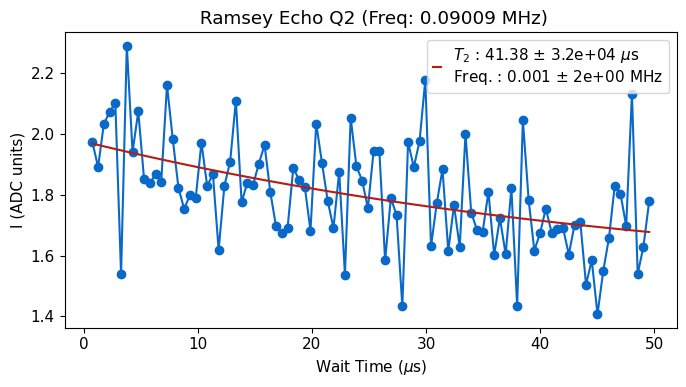

Fit Error too high


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:nan	Fit par error:nan	 Best fit:b'avgi'
R2:0.263	Fit par error:2.255	 Best fit:b'avgi'


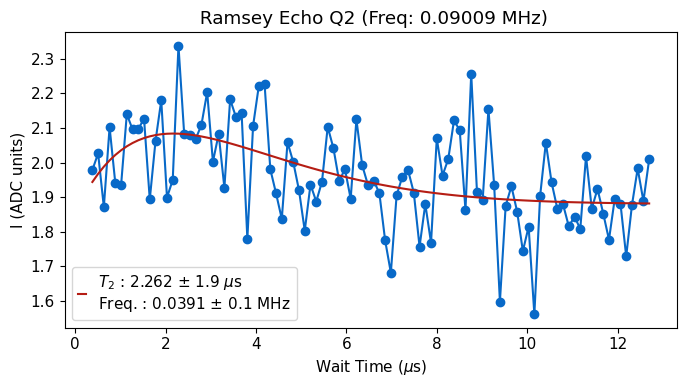

Fit Error too high


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.386	Fit par error:0.608	 Best fit:b'avgi'


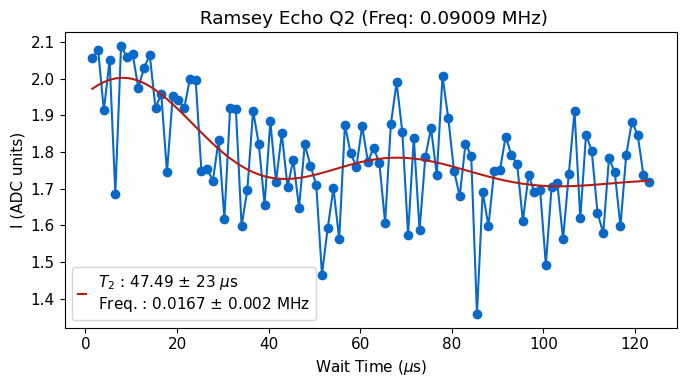

*Set cfg device.qubit 2 T2e to 47.49 from 16.65*


  0%|          | 0/40000 [00:00<?, ?it/s]

R2:0.374	Fit par error:235.626	 Best fit:b'avgi'
R2:0.374	Fit par error:1.257	 Best fit:b'avgi'


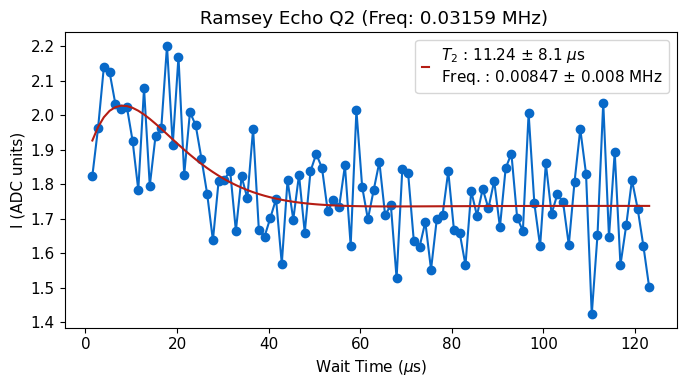

Fit Error too high


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

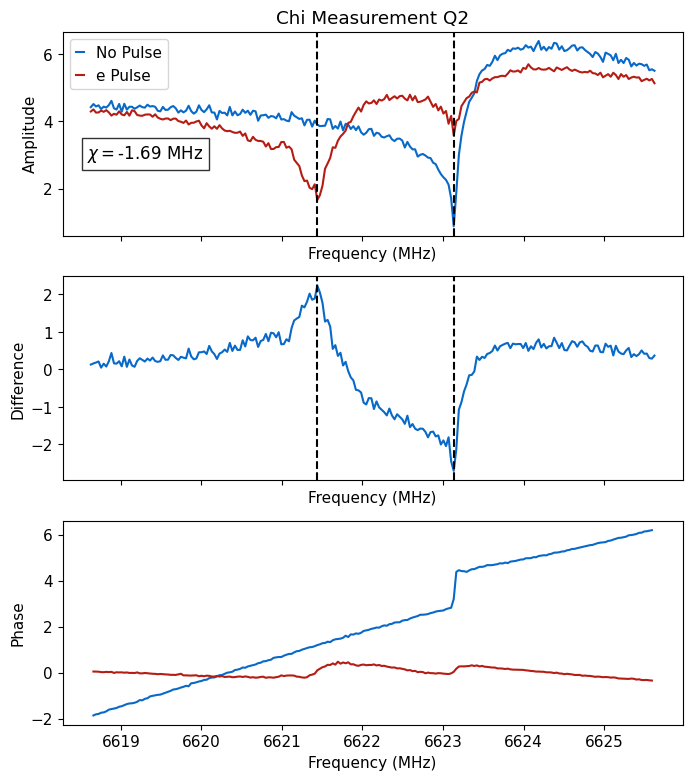

*Set cfg device.readout 2 chi to -1.6933 from -1.6294*


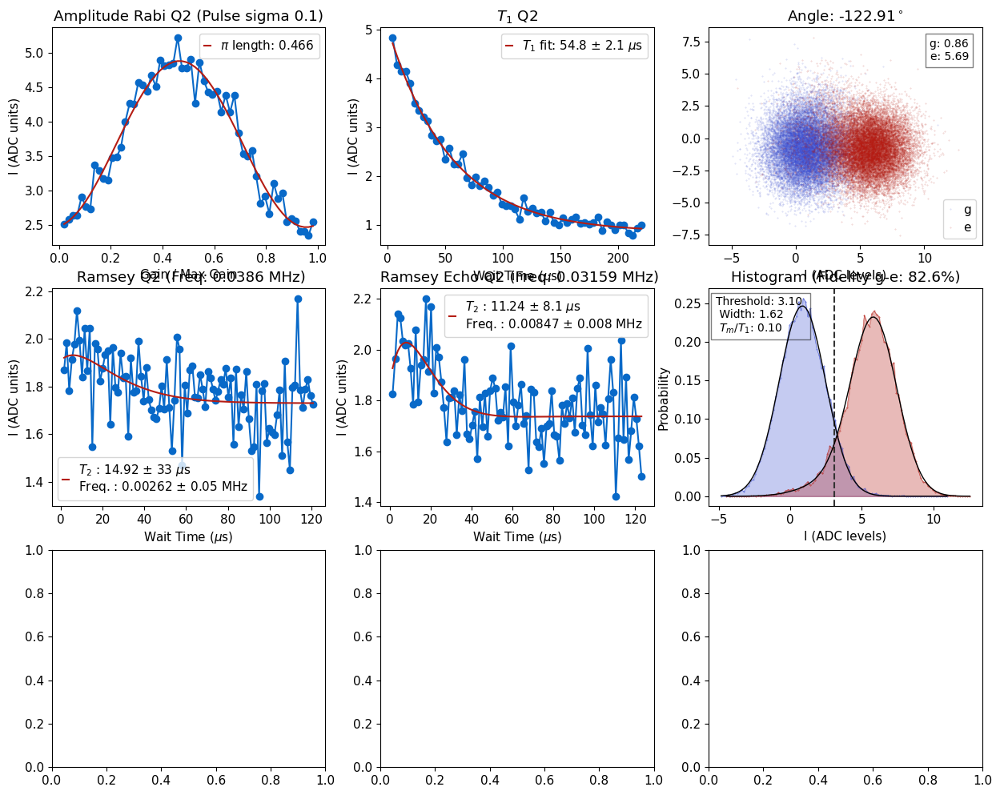

<Figure size 800x400 with 0 Axes>

C:\_Data\Lairon\2025_06_16\images\summary\qubit2_tuneup_20250621_0708.png


In [11]:
qubit_list = np.arange(3)
qubit_list=[0,1,2]

#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad; gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=False, single=False, readout=True)

## Time tracking
fast = True only measures T2r and T1, otherwise does full set of scans.

In [ ]:
scan_length = 24 #  hours 

qubit_list = [0,1,2]
tt=time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True)

Starting run 0, for qubit 0. Time elapsed 0.00 hrs
R2:0.969	Fit par error:0.060	 Best fit:b'avgi'
R2:0.826	Fit par error:0.076	 Best fit:b'avgi'
Starting run 0, for qubit 1. Time elapsed 0.00 hrs
R2:0.988	Fit par error:0.083	 Best fit:b'avgi'


c:\Users\slab\anaconda3\envs\slab\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


R2:0.962	Fit par error:0.034	 Best fit:b'avgi'
Starting run 0, for qubit 2. Time elapsed 0.01 hrs
R2:0.989	Fit par error:0.051	 Best fit:b'avgi'
R2:0.952	Fit par error:0.038	 Best fit:b'avgi'
Starting run 1, for qubit 0. Time elapsed 0.01 hrs
R2:0.973	Fit par error:0.077	 Best fit:b'avgi'
R2:0.913	Fit par error:0.056	 Best fit:b'avgi'
Starting run 1, for qubit 1. Time elapsed 0.01 hrs
R2:0.988	Fit par error:0.074	 Best fit:b'avgi'
R2:0.973	Fit par error:0.027	 Best fit:b'avgi'
Starting run 1, for qubit 2. Time elapsed 0.02 hrs
R2:0.985	Fit par error:0.050	 Best fit:b'avgi'
R2:0.943	Fit par error:0.041	 Best fit:b'avgi'
Starting run 2, for qubit 0. Time elapsed 0.02 hrs
R2:0.957	Fit par error:0.105	 Best fit:b'avgi'
R2:0.917	Fit par error:0.056	 Best fit:b'avgi'
Starting run 2, for qubit 1. Time elapsed 0.02 hrs
R2:0.992	Fit par error:0.055	 Best fit:b'avgi'
R2:0.933	Fit par error:0.044	 Best fit:b'avgi'
Starting run 2, for qubit 2. Time elapsed 0.03 hrs
R2:0.982	Fit par error:0.060	 Be

C:\_Lib\python\slab_qick_calib\fitting.py:337: RuntimeWarning: overflow encountered in exp
  return y0 + yscale * np.exp(-x / decay)


R2:0.988	Fit par error:0.063	 Best fit:b'avgi'
R2:0.918	Fit par error:0.048	 Best fit:b'avgi'
Starting run 18, for qubit 2. Time elapsed 0.21 hrs
R2:0.992	Fit par error:0.037	 Best fit:b'avgi'
R2:0.952	Fit par error:0.037	 Best fit:b'avgi'
Starting run 19, for qubit 0. Time elapsed 0.21 hrs
R2:0.957	Fit par error:0.117	 Best fit:b'avgi'
R2:0.895	Fit par error:0.063	 Best fit:b'avgi'
Starting run 19, for qubit 1. Time elapsed 0.21 hrs
R2:0.988	Fit par error:0.076	 Best fit:b'avgi'
R2:0.945	Fit par error:0.039	 Best fit:b'avgi'
Starting run 19, for qubit 2. Time elapsed 0.22 hrs
R2:0.991	Fit par error:0.039	 Best fit:b'avgi'
R2:0.931	Fit par error:0.045	 Best fit:b'avgi'
Starting run 20, for qubit 0. Time elapsed 0.22 hrs
R2:0.960	Fit par error:0.098	 Best fit:b'avgi'
R2:0.921	Fit par error:0.051	 Best fit:b'avgi'
Starting run 20, for qubit 1. Time elapsed 0.22 hrs
R2:0.990	Fit par error:0.066	 Best fit:b'avgi'
R2:0.953	Fit par error:0.036	 Best fit:b'avgi'
Starting run 20, for qubit 2. 

C:\_Lib\python\slab_qick_calib\fitting.py:593: RuntimeWarning: overflow encountered in exp
  return yscale * (np.sin(2 * np.pi * freq * x + phase_deg * np.pi / 180) + slope) * np.exp(-x / decay) + y0


R2:0.943	Fit par error:0.057	 Best fit:b'avgi'
Starting run 76, for qubit 1. Time elapsed 0.84 hrs
R2:0.994	Fit par error:0.042	 Best fit:b'avgi'
R2:0.939	Fit par error:0.040	 Best fit:b'avgi'
Starting run 76, for qubit 2. Time elapsed 0.84 hrs
R2:0.977	Fit par error:0.047	 Best fit:b'avgi'
R2:0.886	Fit par error:0.068	 Best fit:b'avgi'
Starting run 77, for qubit 0. Time elapsed 0.85 hrs
R2:0.958	Fit par error:0.109	 Best fit:b'avgi'
R2:0.940	Fit par error:0.074	 Best fit:b'avgi'
Starting run 77, for qubit 1. Time elapsed 0.85 hrs
R2:0.991	Fit par error:0.072	 Best fit:b'avgi'
R2:0.934	Fit par error:0.042	 Best fit:b'avgi'
Starting run 77, for qubit 2. Time elapsed 0.85 hrs
R2:0.976	Fit par error:0.047	 Best fit:b'avgi'
R2:0.816	Fit par error:0.086	 Best fit:b'avgi'
Starting run 78, for qubit 0. Time elapsed 0.86 hrs
R2:0.925	Fit par error:0.158	 Best fit:b'avgi'
R2:0.972	Fit par error:0.063	 Best fit:b'avgi'
Starting run 78, for qubit 1. Time elapsed 0.86 hrs
R2:0.986	Fit par error:0.

KeyboardInterrupt: 

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.883	Fit par error:0.036	 Best fit:b'avgi'


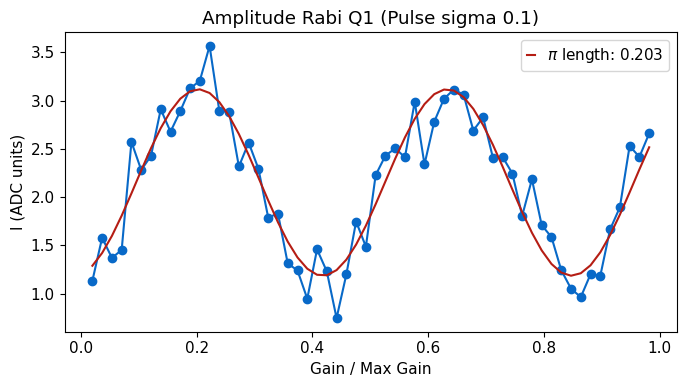

*Set cfg device.qubit 1 ('pulses', 'pi_ge', 'gain') to 0.2029 from 0.2007*


In [55]:
qubit_list = np.arange(13,20)
qubit_list=[1]

update=True

for qi in qubit_list: 
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)
    
    # Fully customized version
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':500,'max_gain':0.1})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

#### Chevron

In [249]:
d2=[]
qubit_list = np.arange(9)
qubit_list=[0]
for qi in qubit_list: 
    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':200,'sigma':0.25,'expts_f':100,'expts':100})

    amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':10, 'expts_f':50})
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

Unexpected parameters found in params: {'expts_f', 'span_f'}


  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
handy.plot_many(d2, title='Rabi Chevron 7864', save_path=cfg_dict['expt_path'])

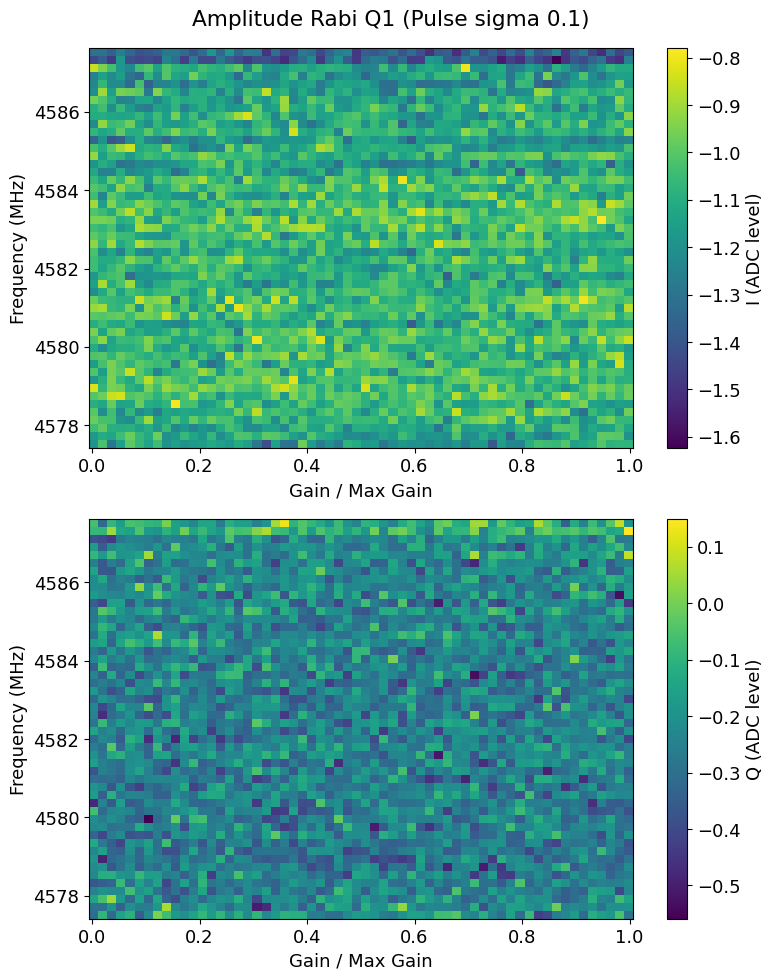

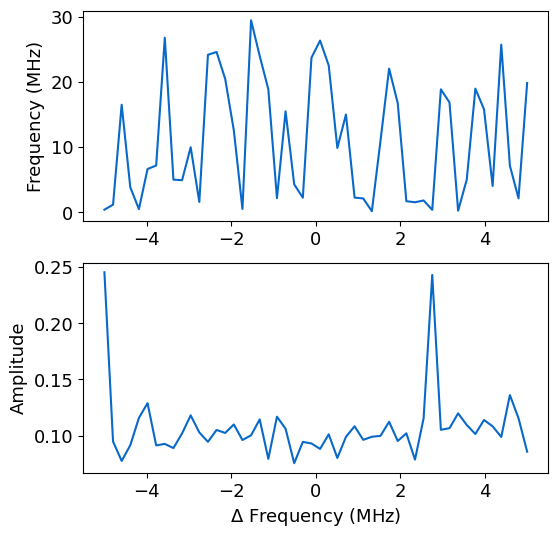

In [244]:
amp_rabi_chevron.display(plot_both=True)

#### 2 Qubit Rabi

In [ ]:
qi=[0,10]
amp_rabi = meas.Rabi_2Q(cfg_dict,qi=qi, params={'active_reset':False})

### Length -- Uses const pulses so do not use to set up pi pulses

Unexpected parameters found in params: {'pulse_type'}


  0%|          | 0/60 [00:00<?, ?it/s]

R2:-0.056	Fit par error:1.384	 Best fit:b'avgi'


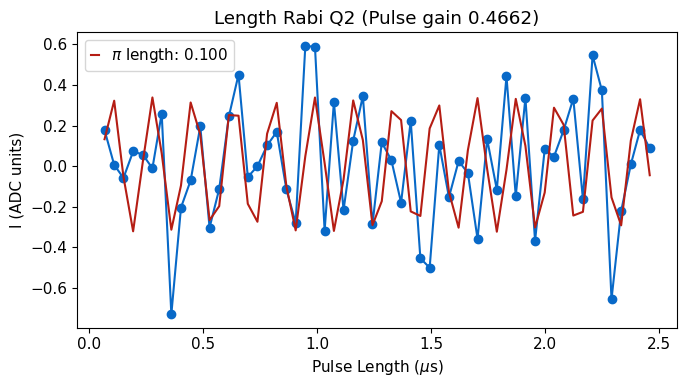

In [30]:
qubit_list = [2]
# This does not work with gaussian pulses due to multiplying qickparams issues -- need to fix
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: const
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})

#### Chevron

In [ ]:
qubit_list = np.arange(20)
qubit_list=[2]
for qi in qubit_list: 
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.605, 'span_f':20})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.205, 'expts_f':60, 'span_f':150, 'gain':0.4,'start_f':6280,'soft_avgs':4})

## Ramsey

In [43]:
qubit_list=[2]
update = True
for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':1,'expts':100, 'span':10,'start':0.01})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

  0%|          | 0/20000 [00:00<?, ?it/s]

Attempted to init fitparam 1 to inf, which is out of bounds 0.001 to 1000.0. Instead init to 500.0005
Attempted to init fitparam 3 to 0.0, which is out of bounds 0.1 to inf. Instead init to inf
Attempted to init fitparam 1 to inf, which is out of bounds 0.001 to 1000.0. Instead init to 500.0005
Attempted to init fitparam 3 to 0.0, which is out of bounds 0.1 to inf. Instead init to inf
Attempted to init fitparam 1 to inf, which is out of bounds 0.001 to 1000.0. Instead init to 500.0005
Attempted to init fitparam 3 to 0.0, which is out of bounds 0.1 to inf. Instead init to inf
Attempted to init fitparam 1 to inf, which is out of bounds 0.001 to 1000.0. Instead init to 500.0005
Attempted to init fitparam 3 to 0.0, which is out of bounds 0.1 to inf. Instead init to inf
R2:-21.498	Fit par error:nan	 Best fit:b'avgi'
Attempted to init fitparam 1 to inf, which is out of bounds 0.001 to 1000.0. Instead init to 500.0005
Attempted to init fitparam 3 to 0.0, which is out of bounds 0.1 to inf. Ins

ValueError: array must not contain infs or NaNs

In [45]:
t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10,go=False)

### Use Ramsey to recenter

In [ ]:
qubit_list = [2]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


In [21]:
update=True
first_time=False

qubit_list = np.arange(3)
qubit_list=[1]
for qi in qubit_list:
    #t1 = meas.T1Experiment(cfg_dict, qi=qi)
    t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':100000,'span':0, 'start':20})

    if update: t1.update(cfg_path, first_time=first_time)

  0%|          | 0/6000000 [00:00<?, ?it/s]

KeyboardInterrupt: 

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

  0%|          | 0/12000 [00:00<?, ?it/s]

R2:0.979	Fit par error:0.041	 Best fit:b'avgi'


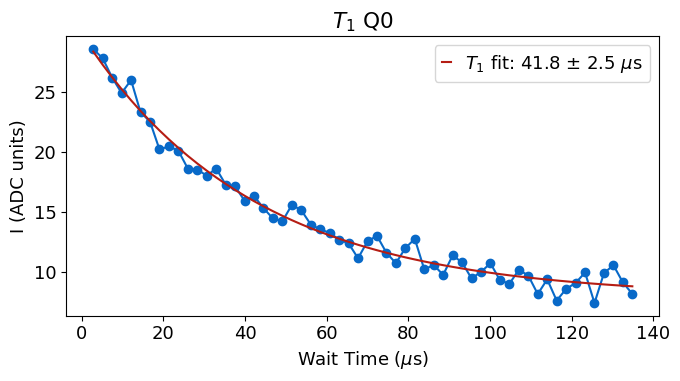

*Set cfg device.qubit 0 T1 to 41.78 from 36.95*


In [8]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

  0%|          | 0/200000 [00:00<?, ?it/s]

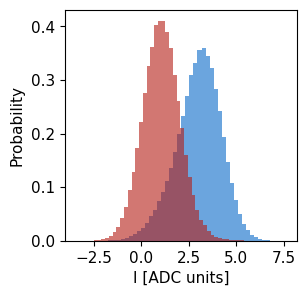

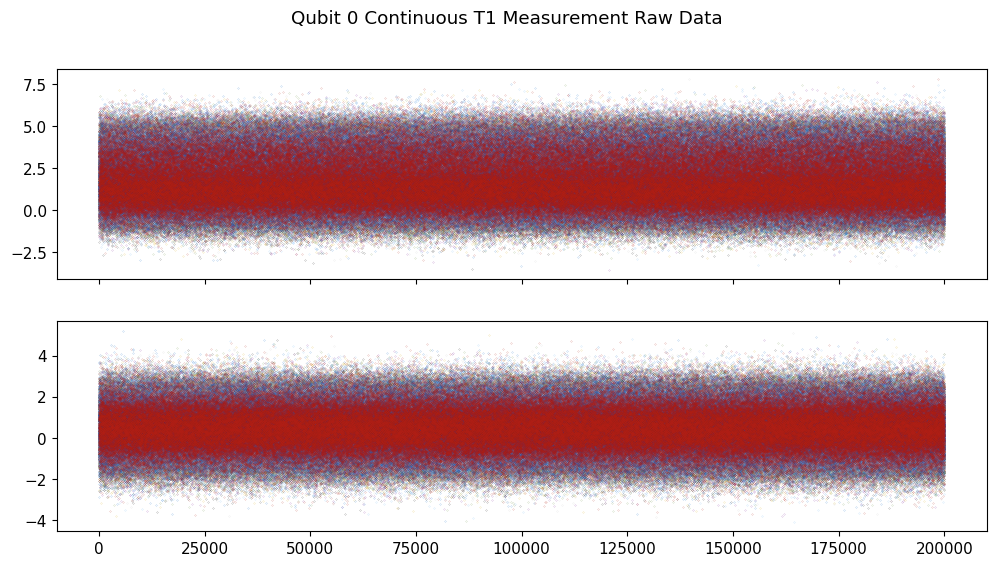

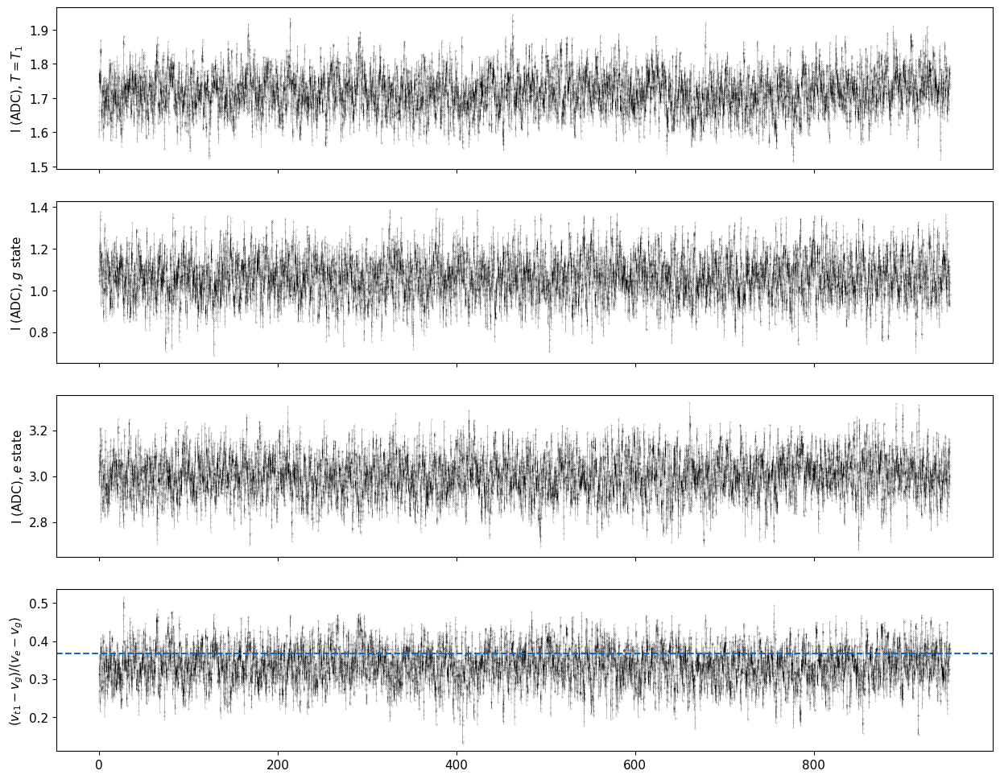

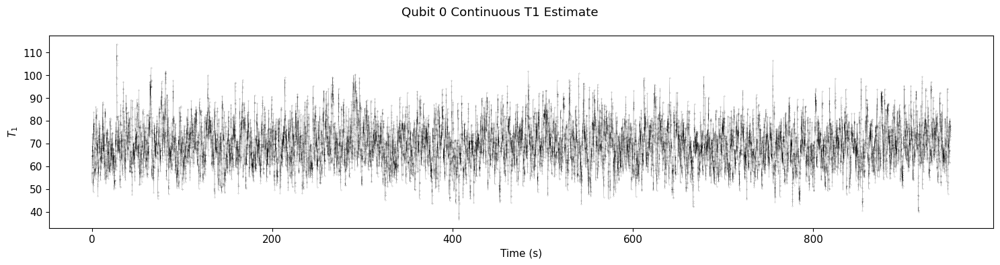

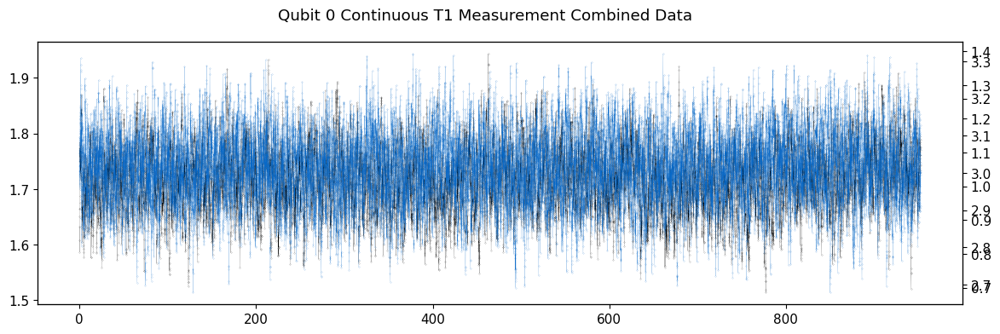

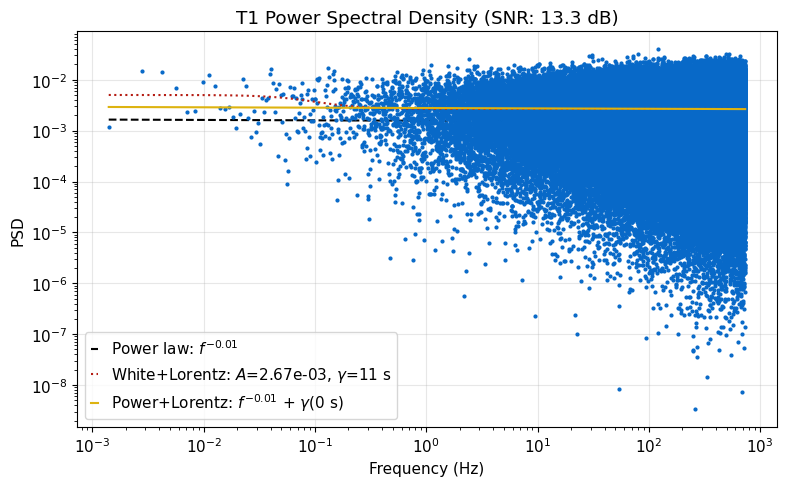

In [16]:
qi=0
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':200000})

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo

  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.664	Fit par error:0.068	 Best fit:b'avgi'


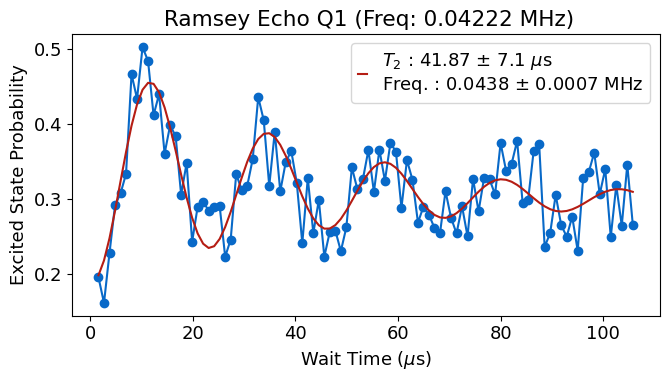

*Set cfg device.qubit 1 T2e to 41.87 from 35.53*


In [41]:
qubit_list = np.arange(20)
qubit_list=[1]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi
Breaks above 12 right now

  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.170	Fit par error:0.439	 Best fit:b'avgi'


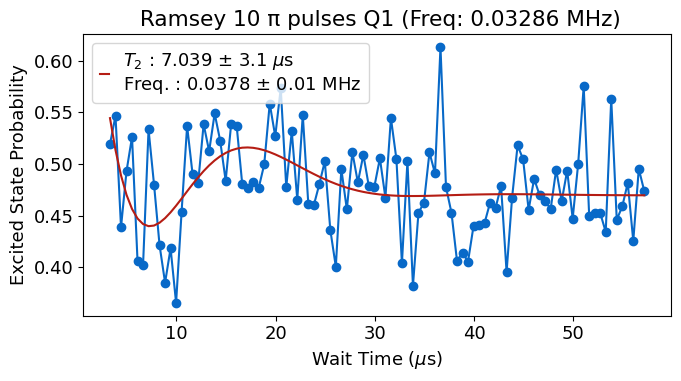

In [40]:
qubit_list = np.arange(20)
qubit_list=[1]
update=True
nums_pi = [10]
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'cpmg','num_pi':pi,'span':100})


### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=10
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':200})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
shot.check_reset()

# Single Shot

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

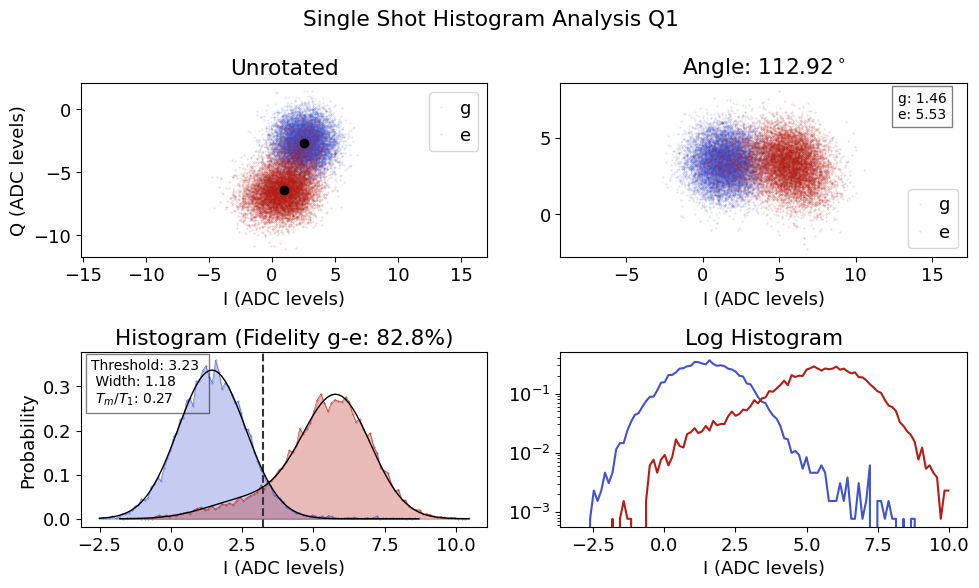

*Set cfg device.readout 1 phase to 112.9215 from 99.946*
*Set cfg device.readout 1 threshold to 3.2325 from 3.4966*
*Set cfg device.readout 1 fidelity to 0.8276 from 0.8216*
*Set cfg device.readout 1 sigma to 1.1843 from 1.1506*
*Set cfg device.readout 1 tm to 0.2725 from 0.1945*
*Set cfg device.qubit 1 tuned_up to True from True*


In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[1]

for qi in qubit_list:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    #shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':300000})
    shot.update(cfg_path)

### Adjust reps for fidelity 

In [ ]:
max_inc = 15 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [0]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

Unexpected parameters found in params: {'step_len', 'step_f', 'step_gain'}


  0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\slab\anaconda3\envs\slab\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


Max fidelity 73.939 %
Optimal params: 
 Freq (MHz) 6623.254 
 Gain (DAC units) 0.035 
 Readout length (us) 4.912
Fidelity is not maximized at the center of the sweep.
Max fidelity found at indices: (0, 1, 0)


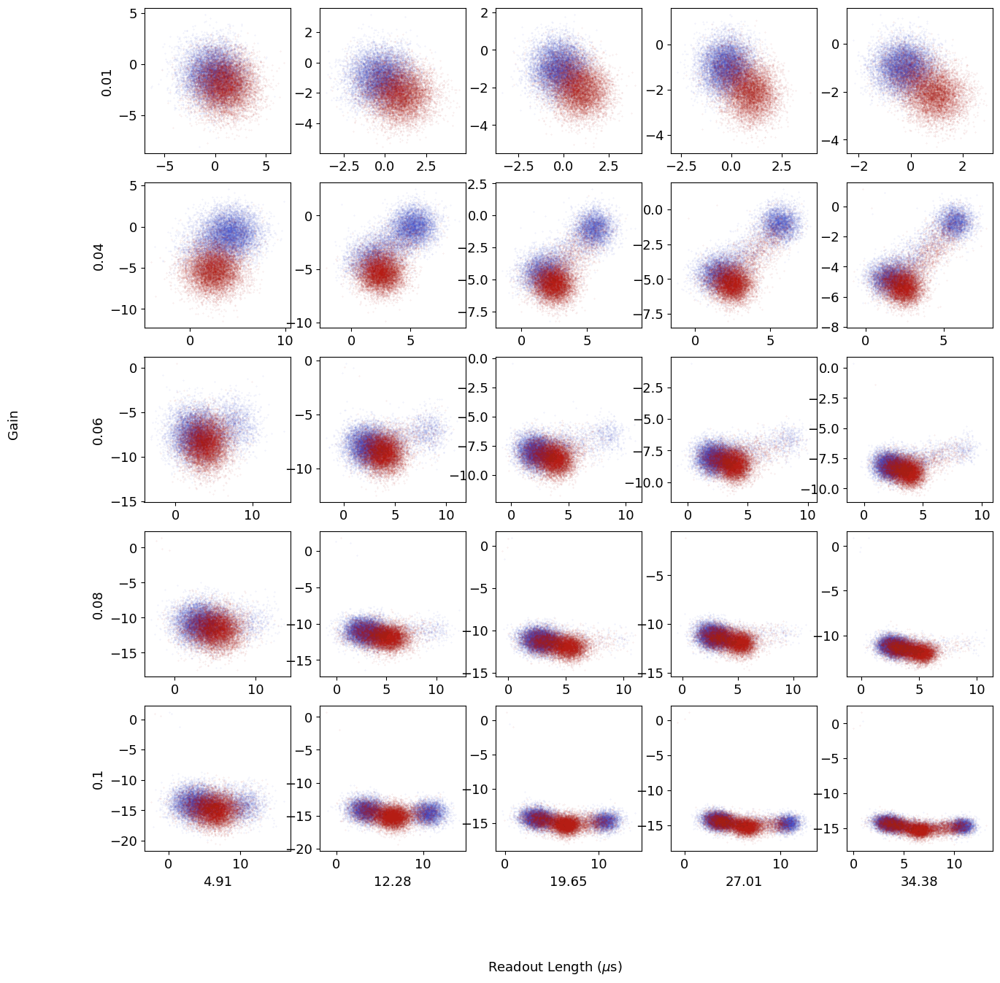

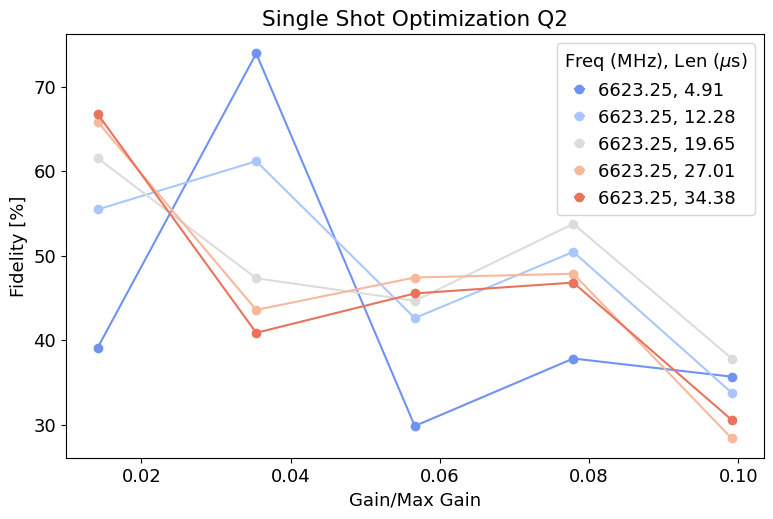

Max fidelity 73.939 %
Optimal params: 
 Freq (MHz) 6623.254 
 Gain (DAC units) 0.035 
 Readout length (us) 4.912
Fidelity is not maximized at the center of the sweep.
Max fidelity found at indices: (0, 1, 0)
*Set cfg device.readout 2 gain to 0.0354 from 0.0472*
*Set cfg device.readout 2 readout_length to 4.9116 from 16.372*
*Set cfg device.readout 2 frequency to 6623.2538 from 6623.2538*


In [ ]:
update=True
low_gain=True

qubit_list=np.arange(14,20)
qubit_list=[2]

params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}
#params = {'expts_f':10, 'expts_gain':1, 'expts_len':1}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params)#, style='fine')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

### Run optimization until it converges

In [ ]:
qubit_list=np.arange(20)
qubit_list=[19]
params = {'expts_f':1, 'expts_gain':7, 'expts_len':7}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

In [ ]:
# Single shot 
qubit_list = np.arange(13,20)
qubit_list =[11]
trig_list = np.linspace(0.2,1,12)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'trigger':trig})
        fids.append(shot.data['fids'][0])
    

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

## Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/30000 [00:00<?, ?it/s]

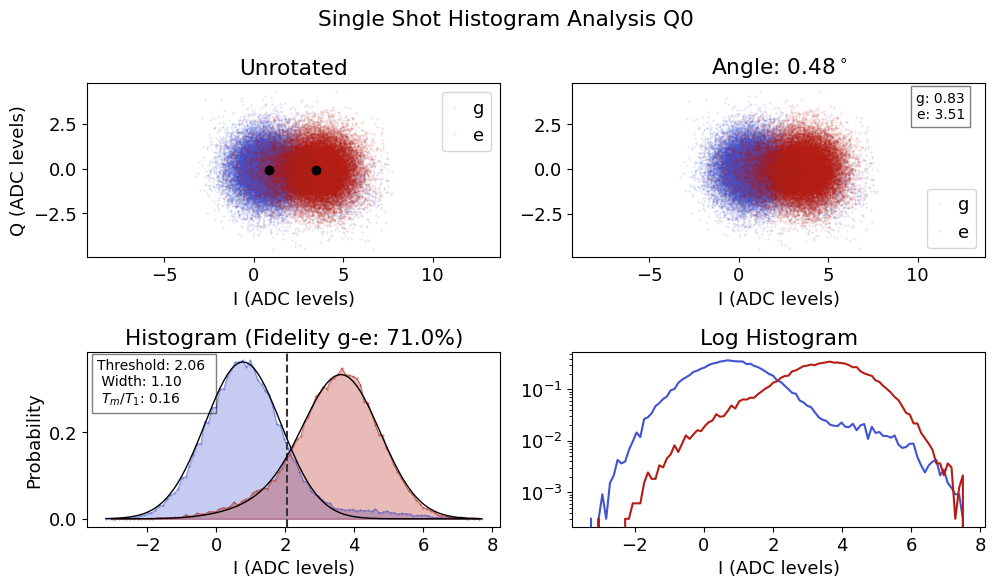

Reset is 0.312089 of e and 4.60427 of g


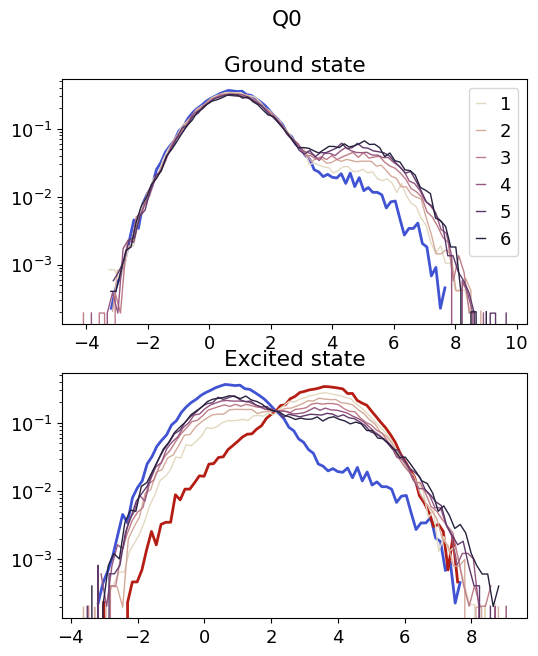

  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/30000 [00:00<?, ?it/s]

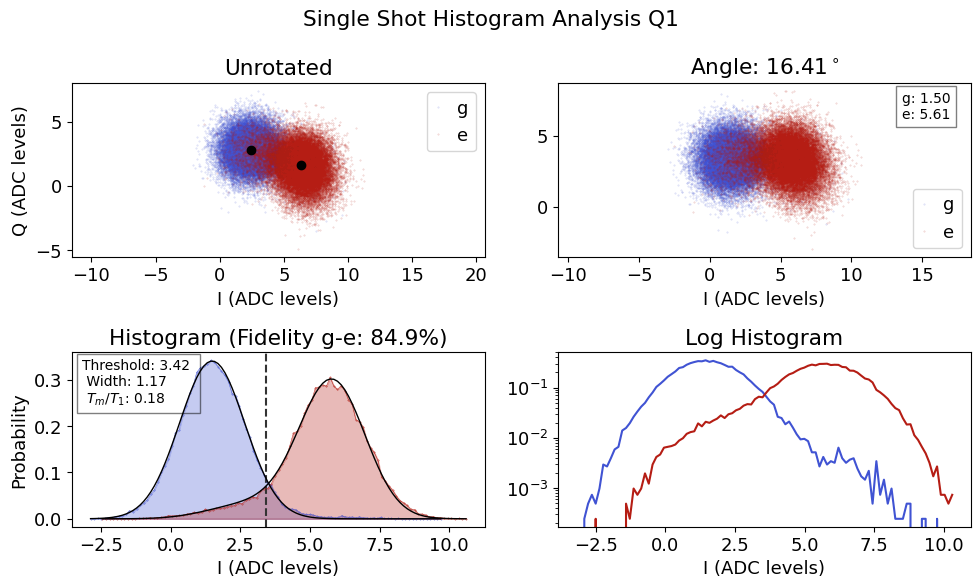

Reset is 0.255255 of e and 5.54169 of g


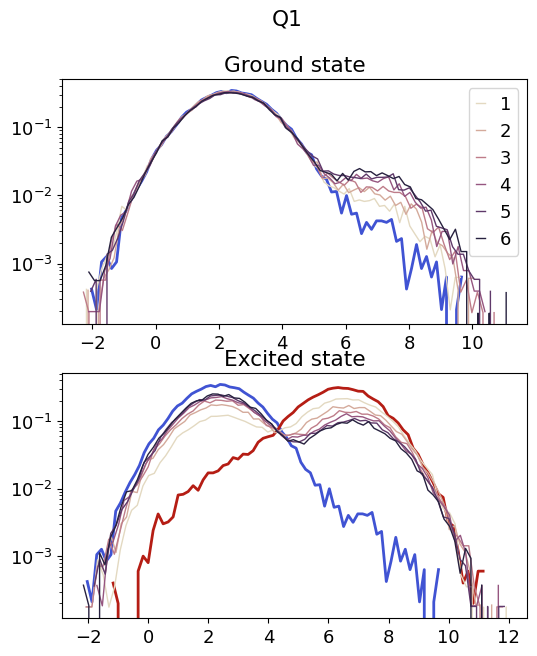

  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/30000 [00:00<?, ?it/s]

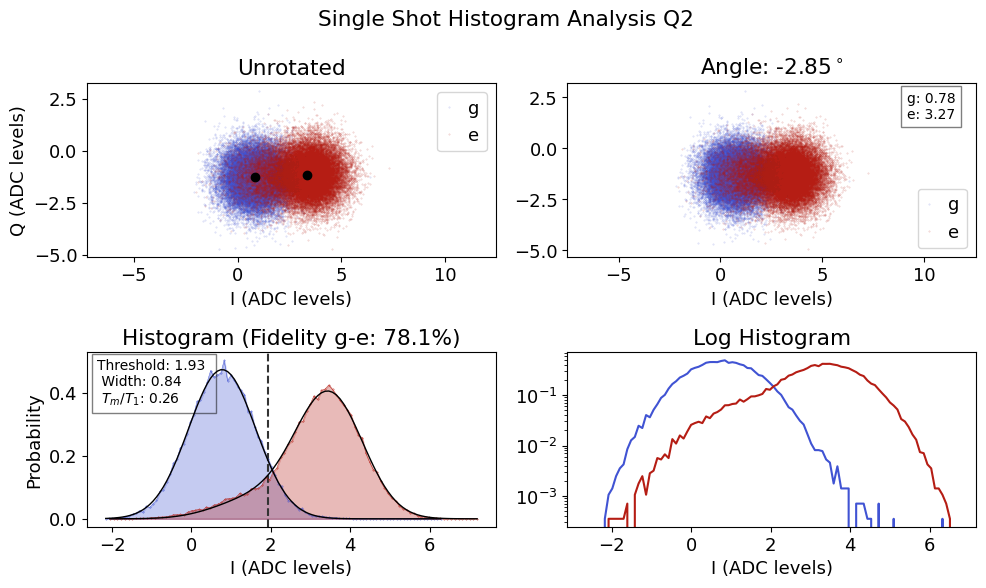

Reset is 0.289964 of e and 13.8674 of g


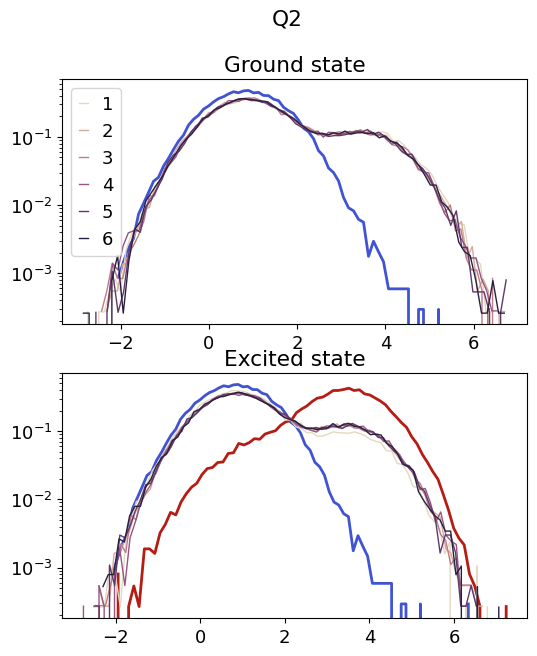

In [ ]:
qubit_list = np.arange(15,20)
qubit_list=[0,1,2]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

### Sweep threshold

In [ ]:
d = []
qi=10
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-25,threshold+25,16)
#thresh = np.linspace(threshold-10,threshold+10,6)
for t in thresh:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':100000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    #shot.check_reset()
tuneup.plot_reset(d)

### Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

### Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

### Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(11,20)
qubit_list =[17]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

In [ ]:
# Need a tuned up pi pulse for this

qubit_list = [1]
for qi in qubit_list: 
    chi, chi_val=tuneup.check_chi(cfg_dict, qi)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [ ]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -150
#qubit_list = np.arange(3)
qubit_list = [1,2]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

## Spectroscopy EF

### General search

Performing medium scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.073	Fit par error:0.201	 Best fit:b'amps'


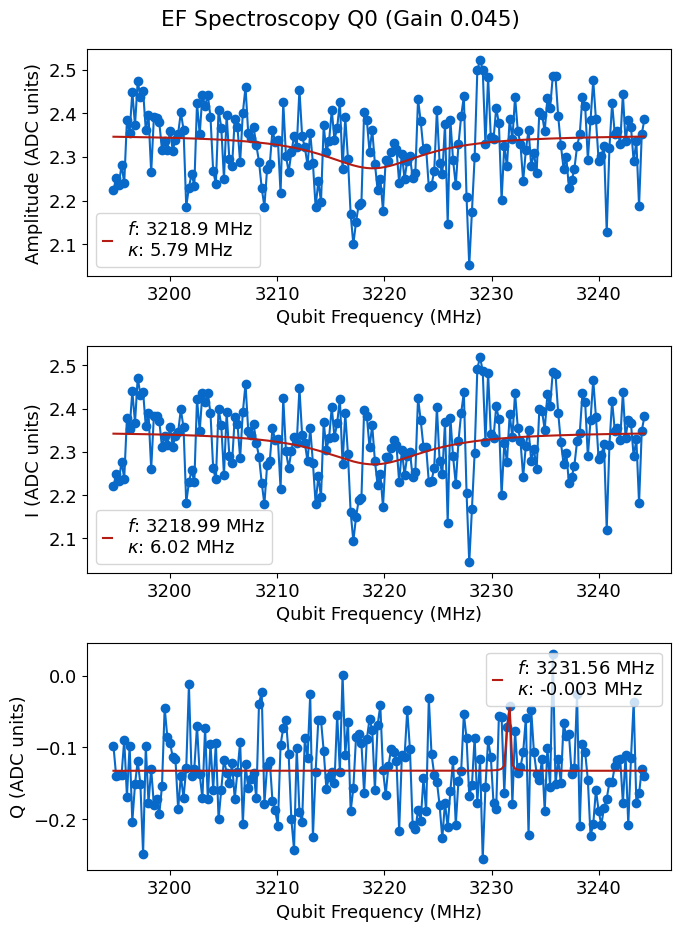

Performing coarse scan


  0%|          | 0/250000 [00:00<?, ?it/s]

R2:0.563	Fit par error:0.034	 Best fit:b'avgi'


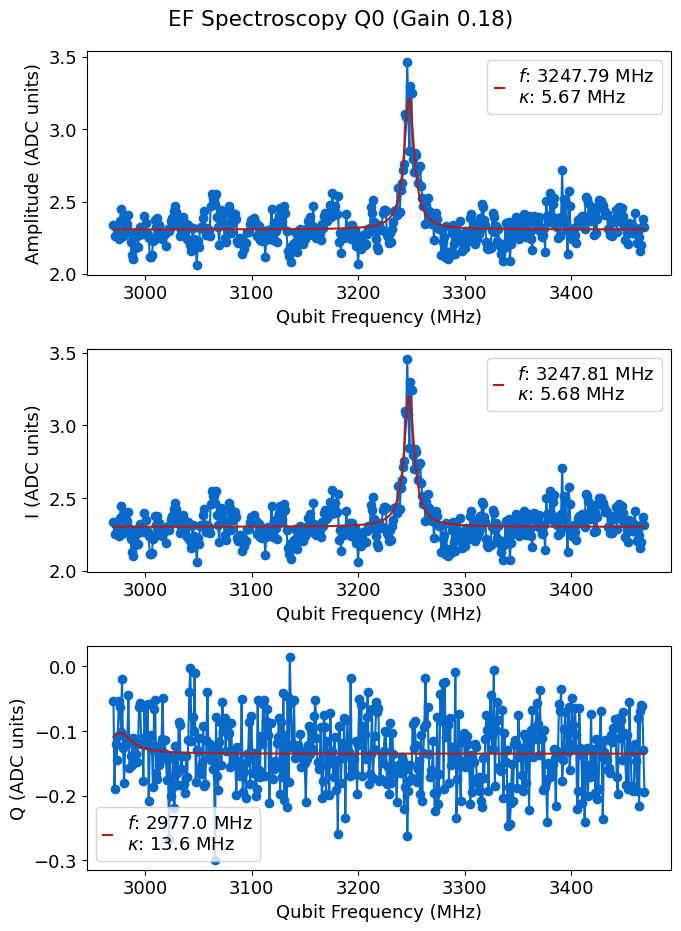

*Set cfg device.qubit 0 f_ef to 3247.8051 from 3219.4876*
Performing medium scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.766	Fit par error:0.033	 Best fit:b'avgi'


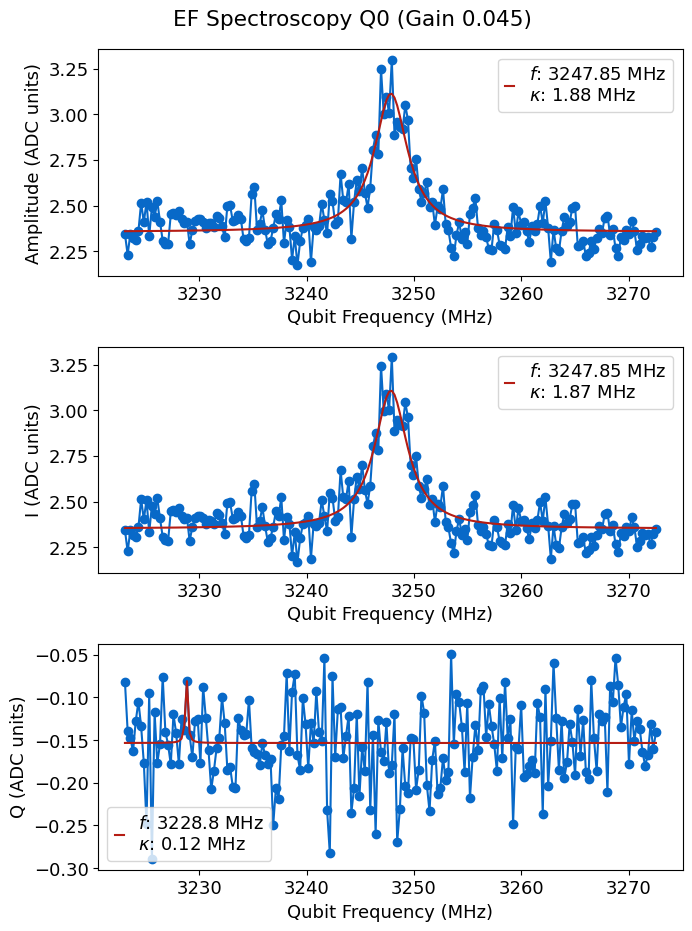

*Set cfg device.qubit 0 f_ef to 3247.8519 from 3247.8051*
Performing fine scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.921	Fit par error:0.025	 Best fit:b'amps'


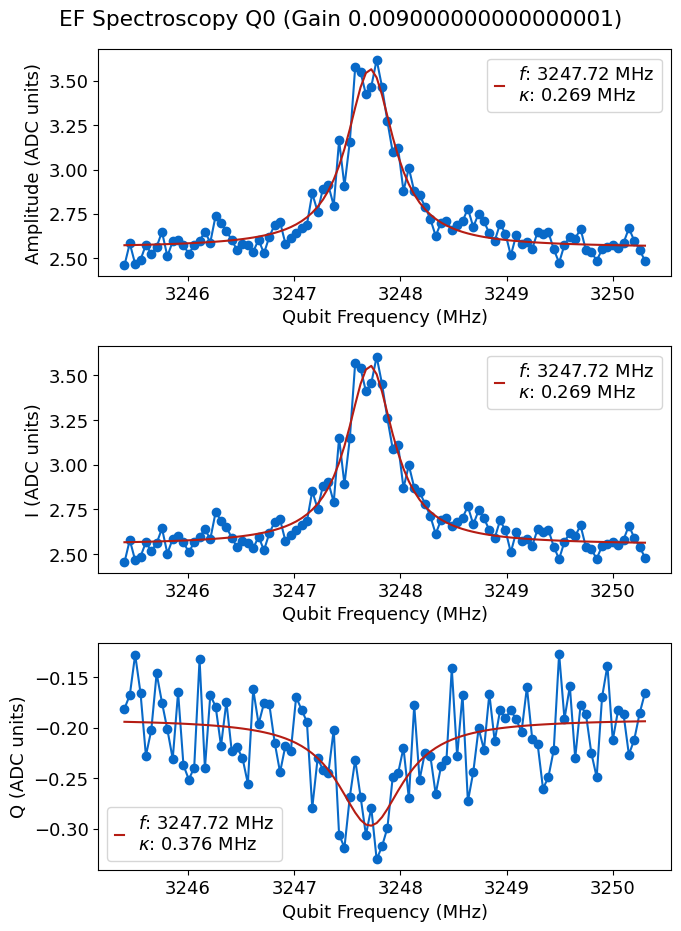

*Set cfg device.qubit 0 f_ef to 3247.7156 from 3247.8519*
Found qubit 0
Performing medium scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.056	Fit par error:0.226	 Best fit:b'avgi'


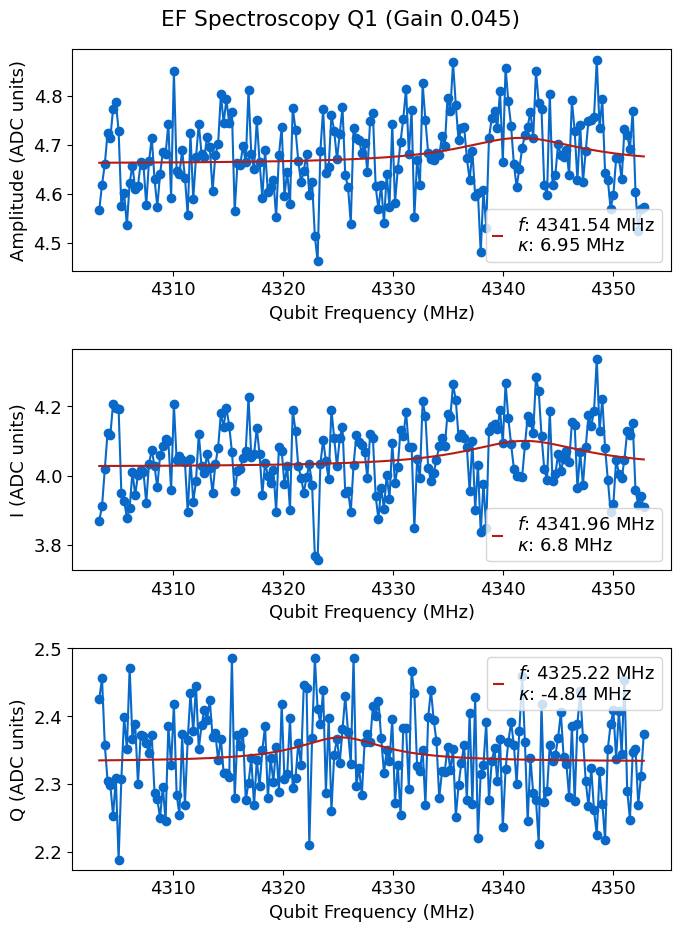

Performing coarse scan


  0%|          | 0/250000 [00:00<?, ?it/s]

R2:0.376	Fit par error:0.049	 Best fit:b'avgi'


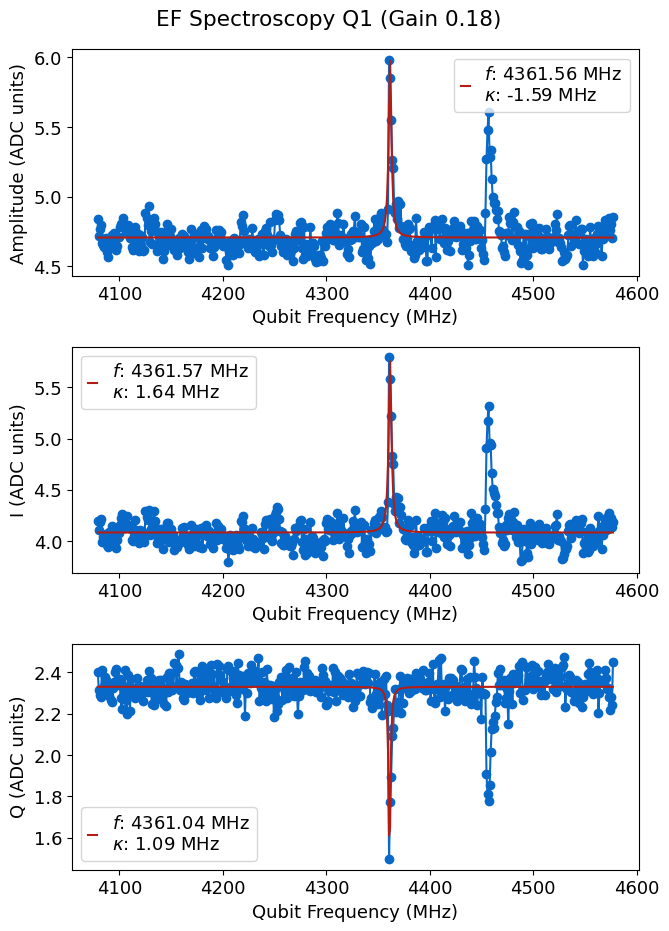

*Set cfg device.qubit 1 f_ef to 4361.566 from 4328.0154*
Performing medium scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.608	Fit par error:0.049	 Best fit:b'avgi'


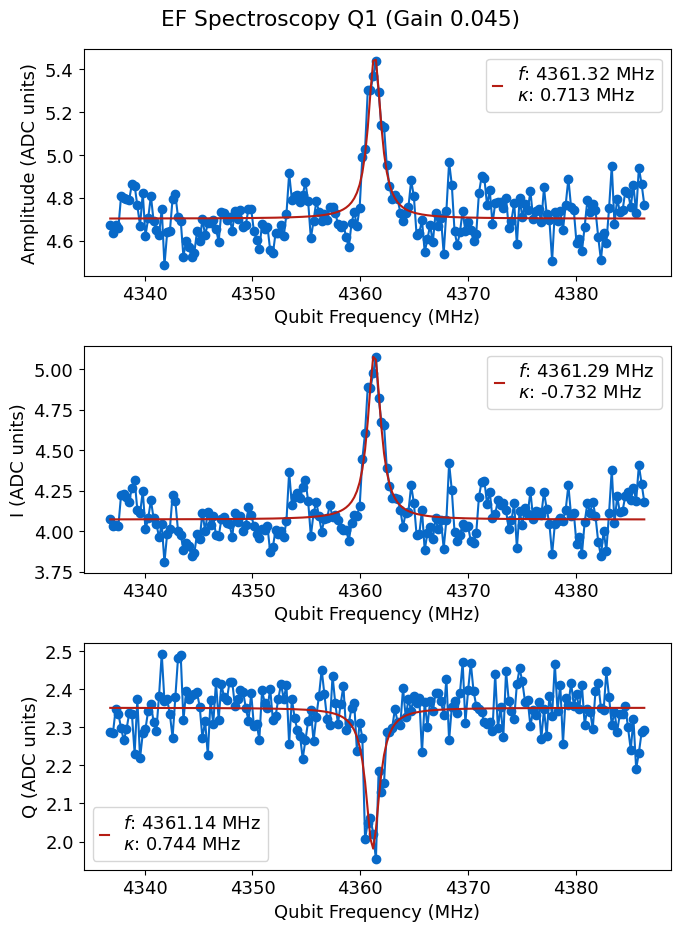

*Set cfg device.qubit 1 f_ef to 4361.2944 from 4361.566*
Performing fine scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.813	Fit par error:0.041	 Best fit:b'avgi'


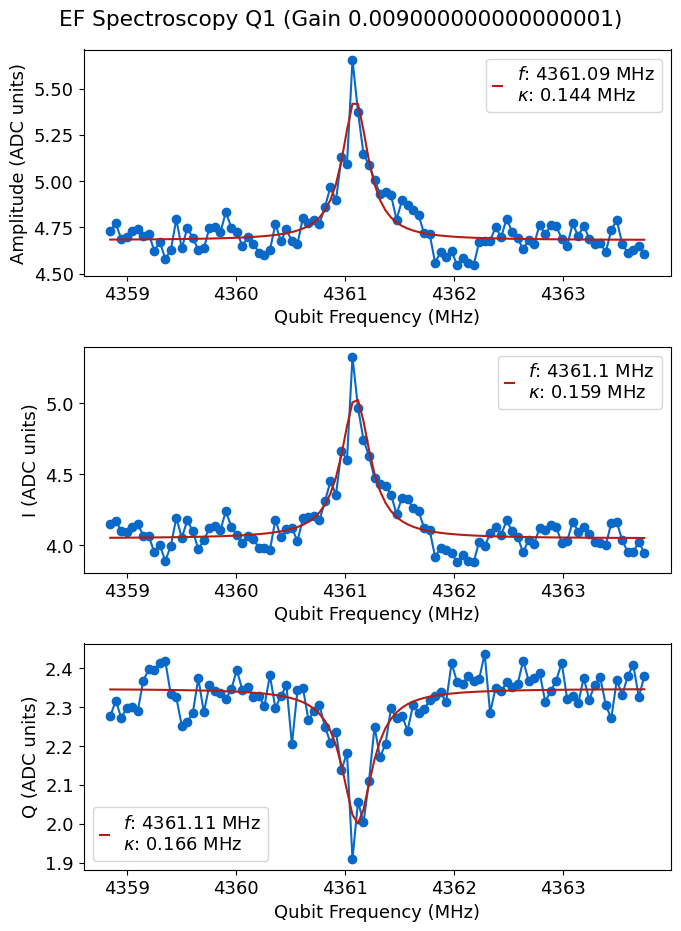

*Set cfg device.qubit 1 f_ef to 4361.0968 from 4361.2944*
Found qubit 1
Performing medium scan


  0%|          | 0/100000 [00:00<?, ?it/s]

c:\_Lib\python\slab_qick_calib\notebooks\..\gen\qick_experiment.py:256: RuntimeWarning: invalid value encountered in sqrt
  data["fit_err_par"] = np.sqrt(np.diag(fit_err)) / fit_pars[inds]
c:\_Lib\python\slab_qick_calib\notebooks\..\gen\qick_experiment.py:357: RuntimeWarning: invalid value encountered in sqrt
  val=(p[ind]), err=np.sqrt(pCov[ind, ind])


R2:0.707	Fit par error:nan	 Best fit:b'avgi'


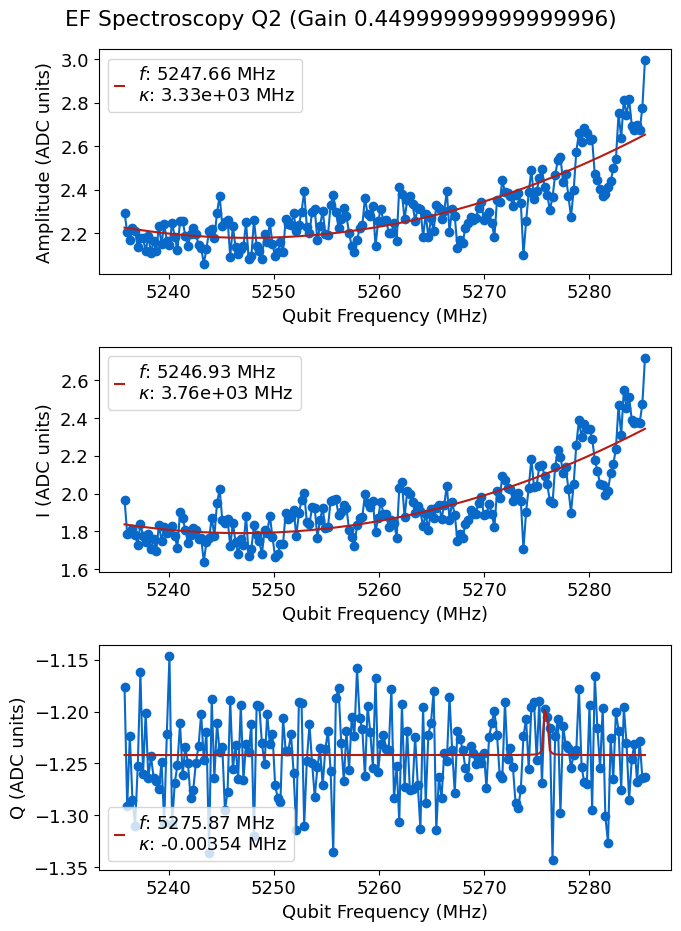

Performing coarse scan


  0%|          | 0/250000 [00:00<?, ?it/s]

R2:0.747	Fit par error:0.022	 Best fit:b'amps'


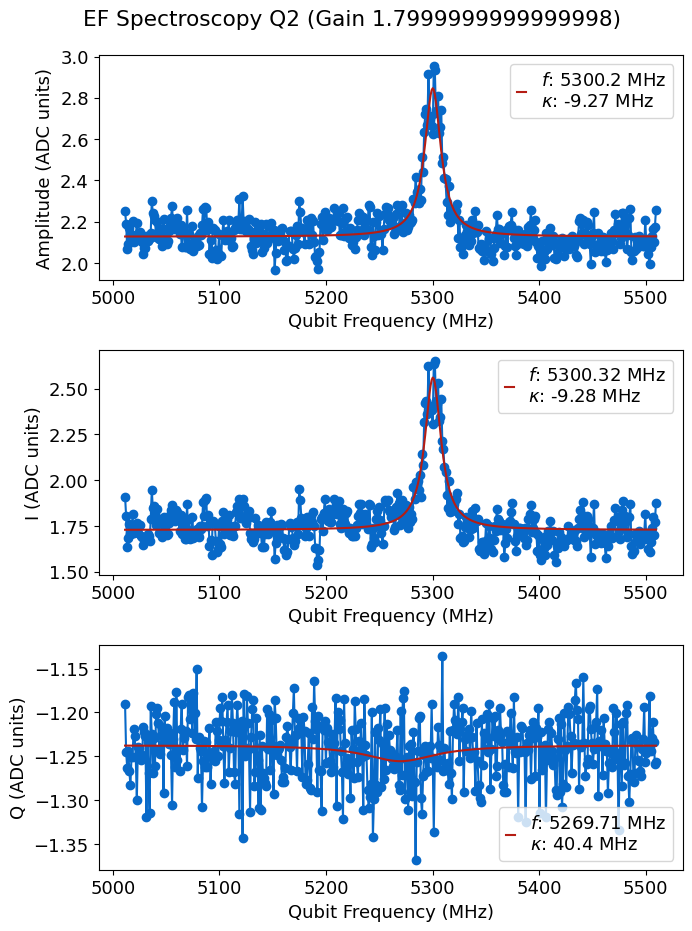

*Set cfg device.qubit 2 f_ef to 5300.1953 from 5260.5458*
Performing medium scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.603	Fit par error:0.172	 Best fit:b'amps'


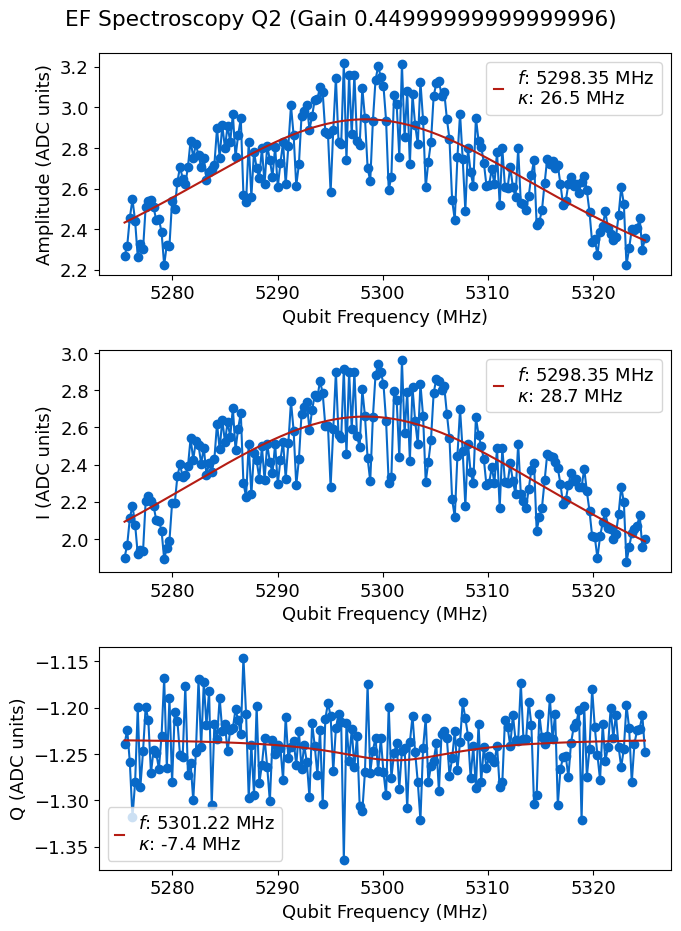

*Set cfg device.qubit 2 f_ef to 5298.3476 from 5300.1953*
Performing fine scan


  0%|          | 0/100000 [00:00<?, ?it/s]

R2:0.283	Fit par error:0.136	 Best fit:b'avgi'


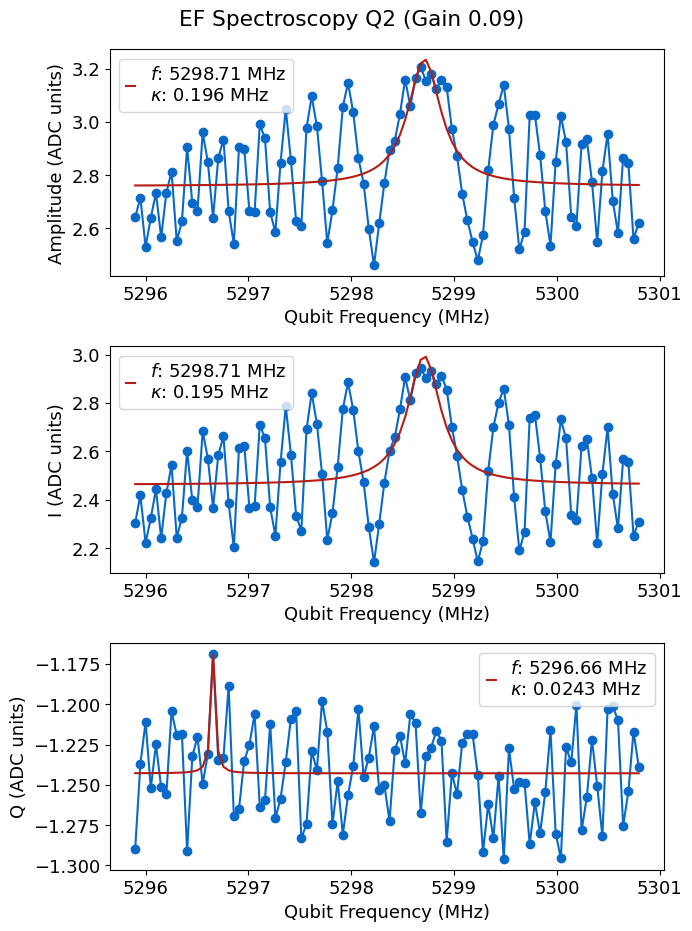

*Set cfg device.qubit 2 f_ef to 5298.7098 from 5298.3476*
Found qubit 2


In [55]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[0,1,2]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

In [ ]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=True

qubit_list = np.arange(10)
qubit_list=[2]
for qi in qubit_list:
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'checkEF':True, 'gain':1,'reps':2000})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

## Rabi EF

  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.983	Fit par error:0.014	 Best fit:b'avgi'


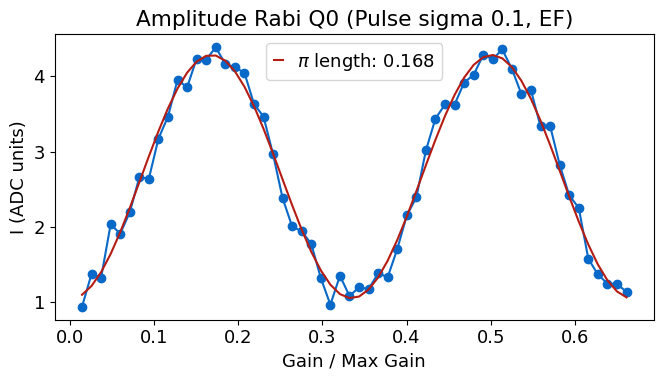

*Set cfg device.qubit 0 ('pulses', 'pi_ef', 'gain') to 0.1682 from 0.1347*


  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.953	Fit par error:0.101	 Best fit:b'avgi'


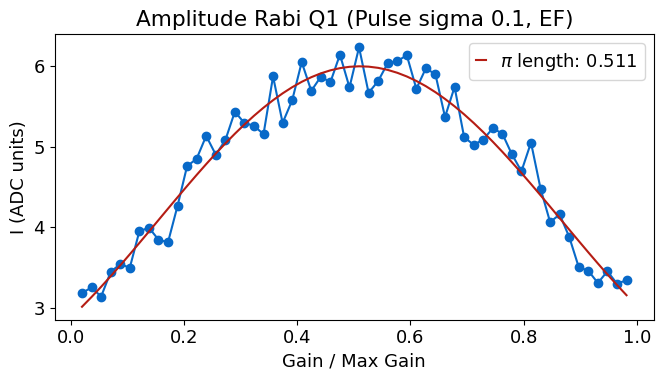

*Set cfg device.qubit 1 ('pulses', 'pi_ef', 'gain') to 0.5108 from 0.2225*


  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.975	Fit par error:0.011	 Best fit:b'avgi'


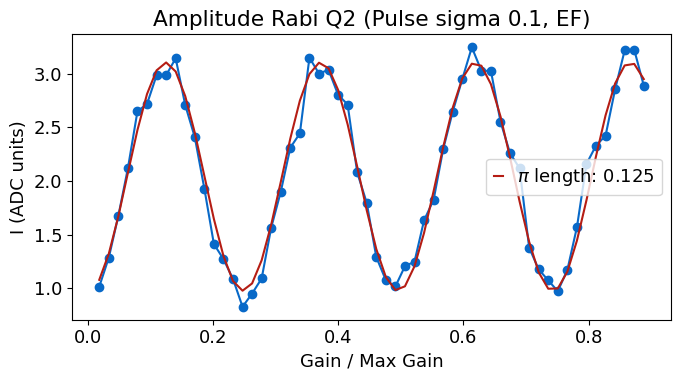

*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'gain') to 0.1246 from 0.1807*


In [56]:
# If first time, initialize the sigma and gain to those of the ge 
first_time =False
update = True

qubit_list = np.arange(3)
qubit_list=[0,1,2]

bad_qubits = []
auto_cfg = config.load(cfg_path)

for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

## Qubit Temperature

  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.970	Fit par error:0.018	 Best fit:b'avgi'


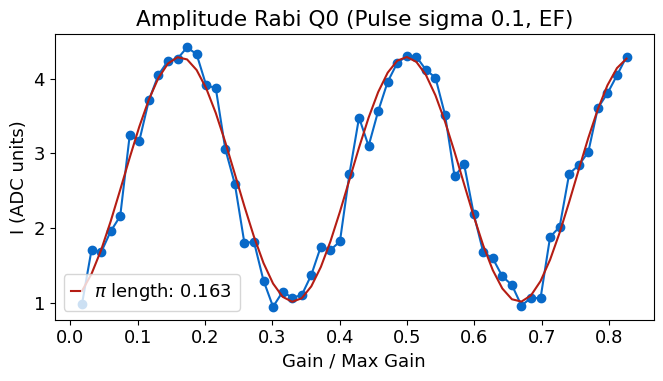

  0%|          | 0/20 [00:00<?, ?it/s]

R2:0.325	Fit par error:3.077	 Best fit:b'avgi'


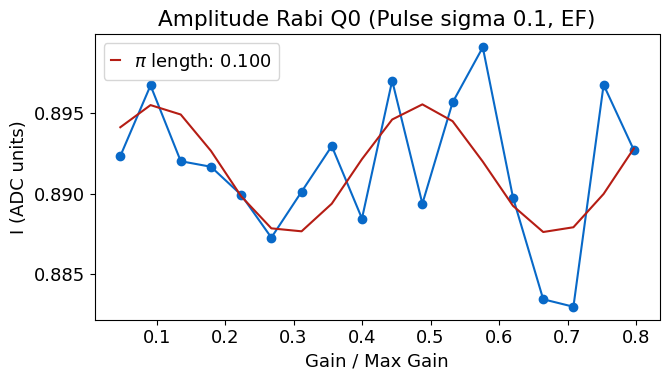

Qubit temp [mK]: 27.079955725712253
State preparation ratio: 0.0024582425671093307
1.6392692794556394
0.0040297215217124935


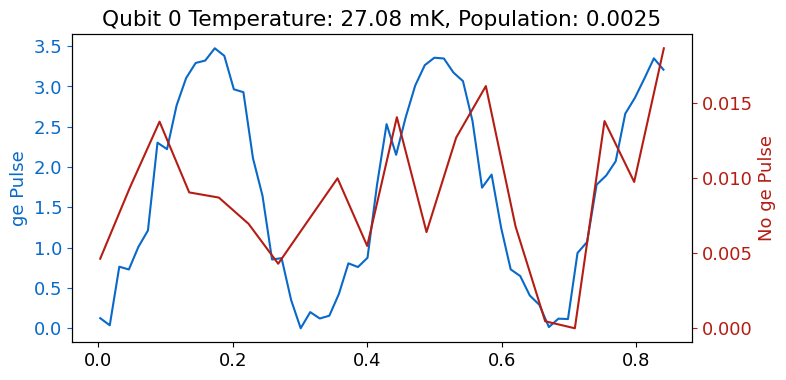

*Set cfg device.qubit 0 temp to 27.08 from 30.7376*
*Set cfg device.qubit 0 pop to 0.0025 from 0.0053*


  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.938	Fit par error:0.335	 Best fit:b'avgi'


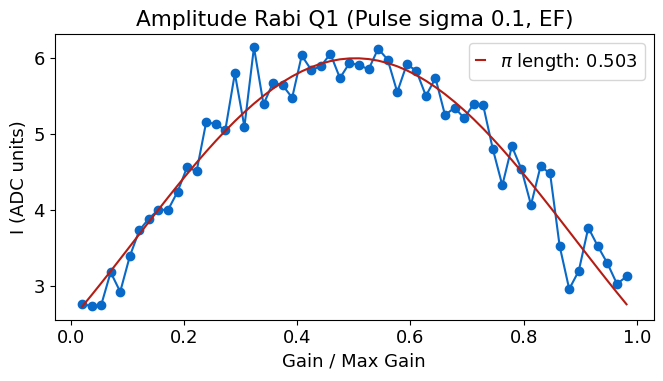

  0%|          | 0/20 [00:00<?, ?it/s]

R2:0.818	Fit par error:0.164	 Best fit:b'avgi'


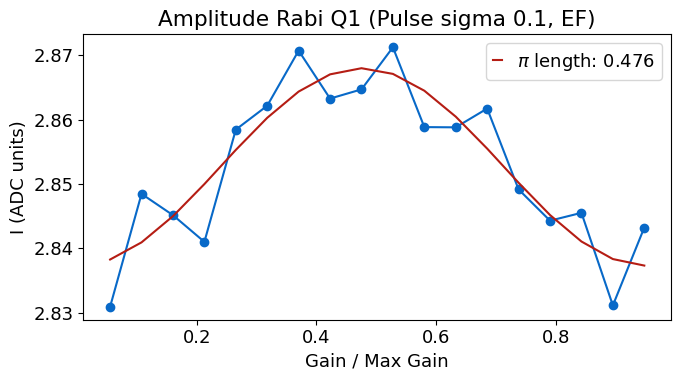

Qubit temp [mK]: 43.56988097998196
State preparation ratio: 0.006424531141123923
2.389085026877353
0.01534875115396644


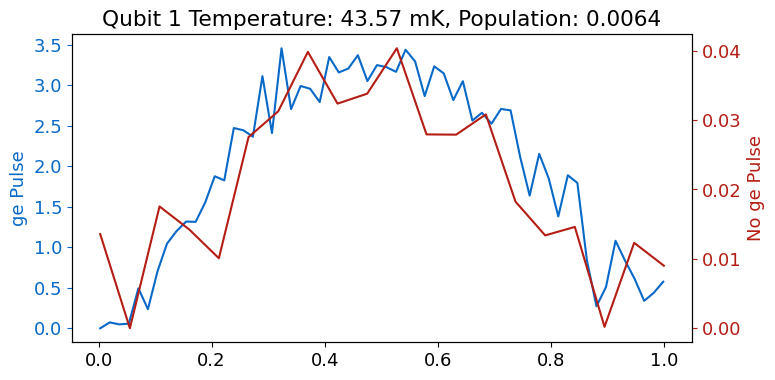

*Set cfg device.qubit 1 temp to 43.5699 from 41.0624*
*Set cfg device.qubit 1 pop to 0.0064 from 0.0049*


  0%|          | 0/6000 [00:00<?, ?it/s]

R2:0.970	Fit par error:0.012	 Best fit:b'avgi'


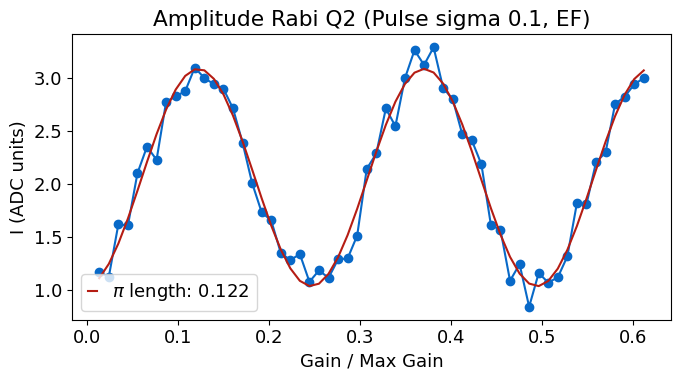

  0%|          | 0/20 [00:00<?, ?it/s]

R2:0.297	Fit par error:0.234	 Best fit:b'avgi'


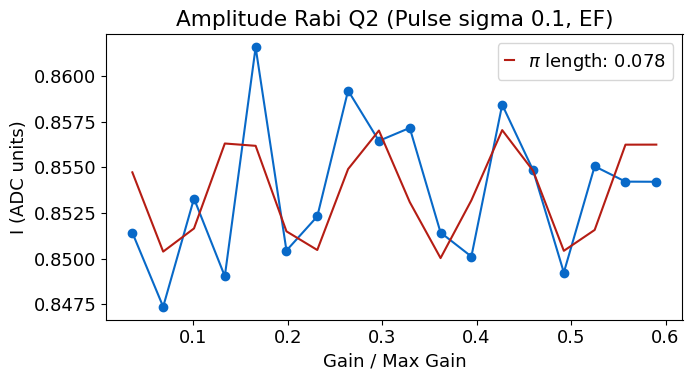

Qubit temp [mK]: 46.98973642345704
State preparation ratio: 0.003459257433120672
1.0278092403951264
0.003555456754666953


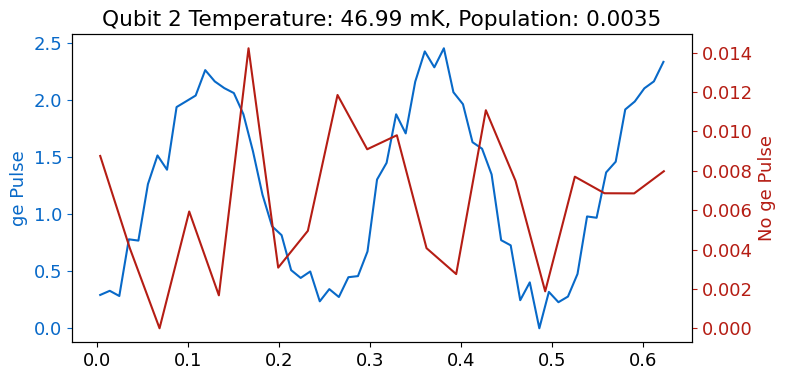

*Set cfg device.qubit 2 temp to 46.9897 from 56.741*
*Set cfg device.qubit 2 pop to 0.0035 from 0.0095*


In [57]:
qubit_list = np.arange(3)
qubit_list=[0,1,2]
for qi in qubit_list: 
    # Soft_avgs will make scan take longer, needed for lower temperatures. 
    temp, pop = tuneup.measure_temp(cfg_dict, qi=qi)# , soft_avgs=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and Ej

In [ ]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(3):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

## Ramsey EF

  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.736	Fit par error:355287.213	 Best fit:b'avgi'
R2:0.736	Fit par error:19.504	 Best fit:b'avgi'


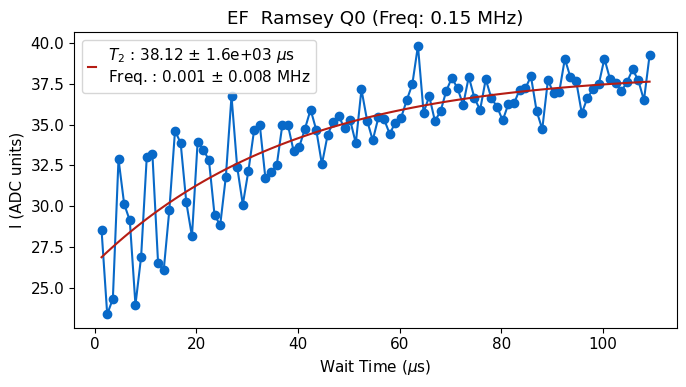

T2 Ramsey fit failed


  0%|          | 0/20000 [00:00<?, ?it/s]

R2:nan	Fit par error:nan	 Best fit:b'avgi'
R2:0.937	Fit par error:0.838	 Best fit:b'avgi'


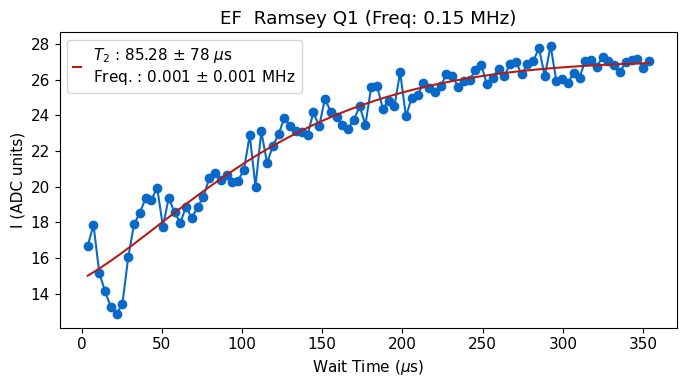

*Set cfg device.qubit 1 f_ef to 4328.222 from 4328.073*


  0%|          | 0/20000 [00:00<?, ?it/s]

R2:0.582	Fit par error:1043469.386	 Best fit:b'avgi'
R2:0.582	Fit par error:41.999	 Best fit:b'avgi'


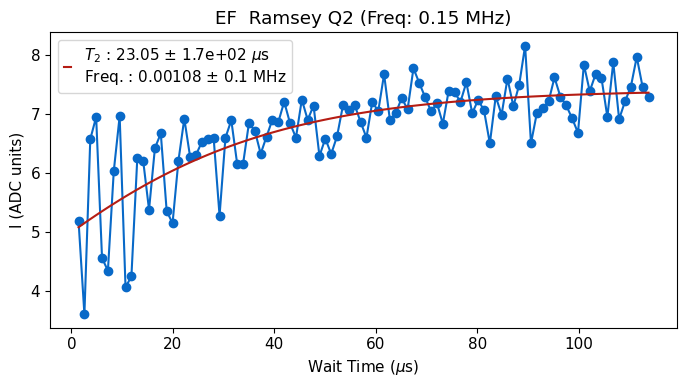

T2 Ramsey fit failed


In [13]:
update=True
qubit_list=np.arange(3)
#qubit_list=[12]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'ramsey_freq':0.15, 'checkEF':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

# Stark

## Ramsey

### Single experiment

In [ ]:
qi=0
meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':0.0,'step':0.1,'df':200,'acStark':True,'ramsey_freq':0.1})

### Sweep frequency

In [ ]:
qubit_list = np.arange(3,20)
qubit_list=[3]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

### Calibrate stark power positive freq

In [ ]:
qubit_list = np.arange(13,20)
qubit_list=[19]
d=[]
freqs= [200]
for f in freqs:
    for qi in qubit_list:
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'expts_gain':12, 'df':f, 'start_gain':0.1, 'end_gain':1})
        d.append(t2rstark)
        config.update_stark(cfg_path, 'q', t2rstark.data['quad_fit'][0], qi)
        config.update_stark(cfg_path, 'l', t2rstark.data['quad_fit'][1], qi)
        config.update_stark(cfg_path, 'o', t2rstark.data['quad_fit'][2], qi)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

In [ ]:
#qubit_list = np.arange(20)
d=[]
qubit_list=[19]
for qi in qubit_list:
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'expts_gain':12, 'df':-100, 'start_gain':0.08, 'end_gain':0.35, 'soft_avgs':2})
    d.append(t2rstark)
    config.update_stark(cfg_path, 'qneg', t2rstark.data['quad_fit'][0], qi)
    config.update_stark(cfg_path, 'lneg', t2rstark.data['quad_fit'][1], qi)
    config.update_stark(cfg_path, 'oneg', t2rstark.data['quad_fit'][2], qi)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

## T1

### Single exp

In [22]:
qi=0
gain_list = [1]
for g in gain_list:
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':10,'span':0,'reps':100000}) 

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/30000000 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Gain sweep

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
flist=[210,180]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'soft_avgs':4})

        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':f,'start_gain':0.3,'end_gain':1,'start':0.2, 'soft_avgs':1,'span':0.5,'expts_gain':80}) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100,'gain':0.5})

### Single evo point linear gain sweep

In [ ]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"soft_avgs":4})

### Run linear scan for multiple qubits

In [ ]:
#first, need to configure active reset and check stark for all. 
nexp = 3
qubit_list =[1,2]#2,4,5,6,7]
expts = 200
t1_data = [[] for _ in qubit_list]

for i in range(nexp):
    for j, qi in enumerate(qubit_list):
        t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=qi, params={ "soft_avgs":2,'expts':100})
        t1_data[j].append(t1_cont.data['t1'])

plt.figure()
fig, ax = plt.subplots(3, 2, figsize=(10, 10))
ax = ax.flatten()
for i, qi in enumerate(qubit_list):
    ax[i].set_title(f'Q{qi}')
    ax[i].pcolormesh(t1_data[i])
    plt.colorbar(ax[i].collections[0], ax=ax[i])

### Repeated single evo, sweep frequency linearly with gain [Main scan]

In [ ]:
d=[]
qi=6
params={'stop_f':20, 'df_pos':100, 'df_neg':-70}
for i in range(200):
    if i%10==0:
        t1stark=meas.T1StarkPowerQuadSingle(cfg_dict, qi=qi, params=params)
        shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        config.update_readout(cfg_path, 'threshold',shot.data['thresholds'][0], qi);
        config.update_readout(cfg_path, 'phase', shot.data['angle'], qi);
        phase.append(shot.data['angle'])
    else:
        t1stark=meas.T1StarkPowerQuadSingle(cfg_dict, qi=qi, params=params, display=False, progress=False)

    d.append(t1stark)

times = [d[i].data['start_time'] for i in range(0, len(d))] 
tm = [datetime.strptime(times[i].decode('utf-8'), '%Y-%m-%d %H:%M:%S') for i in range(len(times))]
time_from_first = [(t - tm[0]).total_seconds() for t in tm]
print(time_from_first)

concatenated_data = np.concatenate([d[i].data['avgi'] for i in range(0, len(d))], axis=1)

plt.figure()
plt.pcolormesh(concatenated_data)

In [ ]:
plt.figure()
concatenated_data = np.concatenate([d[i].data['avgi'] for i in range(0, len(d))], axis=1)
import matplotlib.dates as mdates

plt.pcolormesh(np.array(time_from_first)/60/60, d[-1].data['f_pts'], concatenated_data)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
#plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=1))
#plt.gcf().autofmt_xdate()


### Calib sweep

### Analysis of multiple evo times using normal fittingh

In [ ]:
# Processing for multiple evo times 
cd0 = np.concatenate([d[i].data['avgi_0'] for i in range(0, len(d))], axis=1)
cd1 = np.concatenate([d[i].data['avgi_1'] for i in range(0, len(d))], axis=1)
cd2 = np.concatenate([d[i].data['avgi_2'] for i in range(0, len(d))], axis=1)
cd3 = np.concatenate([d[i].data['avgi_3'] for i in range(0, len(d))], axis=1)

combined_cd = np.stack((cd0, cd1, cd2, cd3), axis=-1)
print(combined_cd.shape)

tms=d[0].data['wait_times']

sns.set_palette('coolwarm',len(combined_cd))
from scipy.optimize import curve_fit
plt.figure()
def t1_fit(x, a, b, c):
    return b * np.exp(-x / c) + a
fits=[]
tm_full = np.linspace(0, tms[3])
#for i in range(5):
for i in range(len(combined_cd)):
    plt.plot(tms, combined_cd[i][0][:],'o-')
    p0 = (np.min(combined_cd[i][0][:]), np.max(combined_cd[i][0][:])-np.min(combined_cd[i][0][:]), tms[2])
    popt, err = curve_fit(t1_fit, tms, combined_cd[i][0][:], p0=p0)
    fit_err = np.sqrt(np.diag(err))   
    if np.mean(fit_err/np.abs(popt))>0.5:
        fits.append(np.nan*np.ones(3))   
    else:
        fits.append(popt)
    #print(p0)
    #plt.plot(tm_full, t1_fit(np.array(tm_full), *popt),'k', label=f'Fit {i}')
    #print(popt)
#plt.legend()
t1_data = [fits[i][2] for i in range(len(fits))]    
offset = [fits[i][0] for i in range(len(fits))]
amp = [fits[i][1] for i in range(len(fits))]

fig, ax = plt.subplots(3, 1, figsize=(8, 7))
ax[0].plot(t1_data, 'o-')
ax[1].plot(offset, 'o-')
ax[2].plot(amp, 'o-')

In [ ]:
# Concatenate all d[i].data['avgi'] into a single dataset
concatenated_data = np.concatenate([d[i].data['avgi'] for i in range(1, len(d))], axis=1)

#print(concatenated_data)

plt.figure()
plt.pcolormesh(concatenated_data)

#### Check max value for calibration

In [ ]:
np.max(t1.data['avgi'], axis=1)
plt.figure()
plt.plot(np.max(t1.data['avgi'], axis=1))